# DATA

## What is this notebook about

This notebook builds upon the notebook ``` spacenet6_masking.ipynb ```

``` spacenet6_masking.ipynb ``` is used to generate all the masks for all 3401 training images, using only the PAN images and geojson_buildings files. These masks will be the same regardless of the original data format, hence it is a run-once-and-forget. 


**Investigate SAR data**

This notebook shall seek to properly handle and preprocess sar data

**Investigate model inputs**

This notebook shall explore the expected input format of the various models. The next notebook shall explore the loss functions

**Explore backbones**

This notebook shall try and explore how to effectively use SAR data, and what to do to make a unet learn well from it

segmentation-models has the following backbones available:
``` ['resnet18', 'resnet34', 'resnet50', 'resnet101', 'resnet152', 'seresnet18', 'seresnet34', 'seresnet50', 'seresnet101', 'seresnet152', 'seresnext50', 'seresnext101', 'senet154', 'resnext50', 'resnext101', 'vgg16', 'vgg19', 'densenet121', 'densenet169', 'densenet201', 'inceptionresnetv2', 'inceptionv3', 'mobilenet', 'mobilenetv2', 'efficientnetb0', 'efficientnetb1', 'efficientnetb2', 'efficientnetb3', 'efficientnetb4', 'efficientnetb5', 'efficientnetb6', 'efficientnetb7'] ```

## Setup COLAB and imports

Mount drive to gain access to files

In [ ]:
''' Used to reference the root directory, for directory traversal ''' 
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
mount_dir = '/content/gdrive'
root_dir = '/content/gdrive/My Drive/Colab Notebooks'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


Installations required

In [ ]:
! pip install fiona
! pip install rasterio
! pip install segmentation-models

     |████████████████████████████████| 14.7MB 210kB/s 
     |████████████████████████████████| 18.2MB 167kB/s 


Imports required

In [ ]:
''' dealing with .tif files '''
import fiona
import rasterio
from rasterio.mask import mask
from rasterio.plot import show, reshape_as_raster, reshape_as_image

''' plotting images '''
from matplotlib import pyplot as plt
%matplotlib inline

''' traversing directories '''
import os
from pathlib import Path

''' core '''
import numpy as np
import pandas as pd

''' utilities '''
from tqdm import tqdm
import copy
import datetime

''' image processing '''
import tensorflow as tf
from tensorflow.keras.preprocessing import image

''' unet model '''
import segmentation_models_dev as sm
from segmentation_models import Unet
from segmentation_models.losses import JaccardLoss, BinaryFocalLoss
from segmentation_models.metrics import IOUScore, FScore

Using TensorFlow backend.


Segmentation Models: using `keras` framework.


## Global

### Constants and lookups
For reference the various image types are as such (amax is a rough gauge) based on the train_all data

```
type             shape                dtype       gauge of max value    gauge of min value
PAN              (1, 900, 900)        uint16      1844                  0
PS-RGB           (3, 900, 900)        uint8       255                   0
PS-RGBNIR        (4, 900, 900)        uint16      2047                  0
RGBNIR           (4, 450, 450)        uint16      2047                  0
SAR-Intensity    (4, 900, 900)        float32     92.87763              0.0
```



In [ ]:
''' get the same sequence for random set every time '''
seed = 42
np.random.seed = seed
tf.seed = seed       

''' lookup - define image channels for each image type '''
IMG_TYPE_LOOKUP = {
    'PAN': {'channels': 1, 'dtype': np.uint16}, 
    'PS-RGB': {'channels': 3, 'dtype': np.uint8}, 
    'PS-RGBNIR': {'channels': 4, 'dtype': np.uint16}, 
    'RGBNIR': {'channels': 4, 'dtype': np.uint16}, 
    'SAR-Intensity': {'channels': 4, 'dtype': np.float32}, 
}

''' image height and width we are working with for the whole notebook '''
IMG_HEIGHT = 256    
IMG_WIDTH = 256

''' root of all paths '''
PATH_SPACENET6 = Path(root_dir + '/spacenet6')

### SIZE, IDX
We will be setting the amount of data that we want to use for train/test
* There are 3401 images for each image type
* The actual spacenet6 "test folder" has only uneseen SAR-Intensity data

Therefore for training purposes, we will pull out our own "test data" from the training set for ease of verifying output 

Random indexes will be used for training and test

In [ ]:
''' set the various sizes we want to use '''
SIZE_ALL = 3401 
SIZE_TRAIN = 800           # CHANGE HERE
SIZE_TEST = 80            # CHANGE HERE
# 800-80, 1600-160, 3200-201

''' set the various idexes we want to use '''
try:
  TRAIN_IDX = np.load(PATH_SPACENET6/('TRAIN_IDX_'+str(SIZE_TRAIN)+'.npy'))
  TEST_IDX = np.load(PATH_SPACENET6/('TEST_IDX_'+str(SIZE_TEST)+'.npy'))
  print('TRAIN/TEST indexes available. Loading ')
except:
  ''' Generate the indexes that we will be using for train and test '''  
  ALL_IDX = np.arange(SIZE_ALL)

  TRAIN_IDX = np.random.choice(ALL_IDX, SIZE_TRAIN, replace=False)
  TRAIN_IDX.sort()

  ALL_IDX_2 = np.setdiff1d(ALL_IDX, TRAIN_IDX)

  TEST_IDX = np.random.choice(ALL_IDX_2, SIZE_TEST, replace=False)
  TEST_IDX.sort()

  np.save(PATH_SPACENET6/('TRAIN_IDX_'+str(SIZE_TRAIN)), TRAIN_IDX)
  np.save(PATH_SPACENET6/('TEST_IDX_'+str(SIZE_TEST)), TEST_IDX)
  print('TRAIN/TEST indexes not available. Generated and saved ')

TRAIN/TEST indexes available. Loading 


### Rotation file
These are the images that have been rotated

In [ ]:
TO_ROTATE = []
PATH_ORIENTATIONS = PATH_SPACENET6/'spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SummaryData/SAR_orientations.txt'

orientation_file = open(PATH_ORIENTATIONS, "r")
for line in orientation_file:
  tilename = line.split(' ')[0]
  orientation_flag = int(line.split(' ')[1])

  if orientation_flag == 1:
    TO_ROTATE.append(tilename)

TO_ROTATE.sort()

print('orientation file loaded')

orientation file loaded


## Helper functions

### rotation()

In [ ]:
def rotation(filename, img):
  try:
    if filename.split(IMG_TYPE+'_')[1].split('_tile_')[0] in TO_ROTATE:
      return np.fliplr(np.flipud(img))
    else:
      return img
  except: 
    pass

  try:
    if filename.split('Buildings_')[1].split('_tile_')[0] in TO_ROTATE:
      return np.fliplr(np.flipud(img))
    else:
      return img
  except: 
    pass
      
  
  return img

### plot_XY()

In [ ]:
def plot_XY(plotname, X, Y, X_name, Y_name):
  ix = np.random.randint(0, len(X))
  print("index: {}".format(ix))
  print(plotname, " set")

  fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16,5))
  show(reshape_as_raster(X[ix]), ax=ax1, title=X_name)
  show(reshape_as_raster(Y[ix]), ax=ax2, title=Y_name)
  plt.show()

### plot_XY_preds()

In [ ]:
def plot_XY_preds(plotname, X, Y, P, X_name, Y_name, P_name, index=None):
  if index==None:
    ix = np.random.randint(0, len(X))
  else:
    ix = index
  print("index: {}".format(ix))
  print(plotname, " set")

  fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(16,5))

  if X.dtype == 'float32':
    show(reshape_as_raster(  (X[ix] - np.amin(X)) / (np.amax(X) - np.amin(X))   ), ax=ax1, title=X_name)
  else:
    show(reshape_as_raster(X[ix]), ax=ax1, title=X_name)
  show(reshape_as_raster(Y[ix]), ax=ax2, title=Y_name)
  show(reshape_as_raster(P[ix]), ax=ax3, title=P_name)
  plt.show()

### plot_history()

In [ ]:
def plot_history(history):
  fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(16,5))

  ax1.plot(history['loss'], label='train')
  ax1.plot(history['val_loss'], label='val')
  ax1.title.set_text('loss')
  ax1.legend()

  ax2.plot(history['iou_score'], label='train')
  ax2.plot(history['val_iou_score'], label='val')
  ax2.title.set_text('iou_score')
  ax2.legend()

  ax3.plot(history['f1-score'], label='train')
  ax3.plot(history['val_f1-score'], label='val')
  ax3.title.set_text('f1-score')
  ax3.legend()

### store_metrics()
Save into the metrics file

In [ ]:
PATH_METRICS = PATH_SPACENET6/'metrics_keras_11.csv'

try: 
  METRICS_HISTORY = pd.read_csv(PATH_METRICS)
except:
  TIMESTAMP = datetime.datetime.now().strftime("%d/%m/%Y %H:%M:%S")
  IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS = 'trial', 'trial', 'trial', 'trial', 'trial', 'trial'
  MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, train_loss, train_iou_score, train_f1_score, val_loss, val_iou_score, val_f1_score, test_loss, test_iou_score, test_f1_score = 0,0,0,0,0,0,0,0,0,0,0,0

  METRICS_HISTORY = pd.DataFrame(np.array([[TIMESTAMP, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, 
                              train_loss, train_iou_score, train_f1_score, 
                              val_loss, val_iou_score, val_f1_score, 
                              test_loss, test_iou_score, test_f1_score
                              ]]),
                    columns=['timestamp', 'img_type', 'img_rotated', 'model_type', 'pretrain', 'loss_function', 'comments', 'epochs', 'size_train', 'size_test', 
                              'train_loss', 'train_iou_score', 'train_f1-score', 
                              'val_loss', 'val_iou_score', 'val_f1-score', 
                              'test_loss', 'test_iou_score', 'test_f1-score'
                              ],
                    )
  METRICS_HISTORY.to_csv(PATH_METRICS, index=False)

In [ ]:
def store_metrics(train_loss, train_iou_score, train_f1_score, val_loss, val_iou_score, val_f1_score, test_loss, test_iou_score, test_f1_score, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS):
  TIMESTAMP = datetime.datetime.now().strftime("%m/%d/%Y %H:%M:%S")

  ''' create another df that looks just like that and concat with ''' 
  new_metrics = pd.DataFrame(np.array([[TIMESTAMP, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST,
                             train_loss, train_iou_score, train_f1_score, 
                             val_loss, val_iou_score, val_f1_score, 
                             test_loss, test_iou_score, test_f1_score
                             ]]),
                   columns=['timestamp', 'img_type', 'img_rotated', 'model_type', 'pretrain', 'loss_function', 'comments', 'epochs', 'size_train', 'size_test', 
                            'train_loss', 'train_iou_score', 'train_f1-score', 
                            'val_loss', 'val_iou_score', 'val_f1-score', 
                            'test_loss', 'test_iou_score', 'test_f1-score'
                            ],
                  )
  
  # METRICS_HISTORY = pd.read_csv(PATH_METRICS)
  # METRICS_HISTORY = pd.concat([new_metrics, METRICS_HISTORY])
  # METRICS_HISTORY.to_csv(PATH_METRICS, index=False)
  new_metrics.to_csv(PATH_METRICS, mode='a', header=False, index=False)
  print("saved model metrics")

## Generator

### gen_input_image_details()
Reading several papers has indicated that 256x256 size is a good size for the model, hence we shall use it as the image size for now. We will set the output specifications here

In [ ]:
def gen_input_image_details(IMG_TYPE, IMG_ROTATED, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH, IMG_TYPE_LOOKUP=IMG_TYPE_LOOKUP):
  print('gen_input_image_details()')
  
  IMG_CHANNELS = IMG_TYPE_LOOKUP[IMG_TYPE]['channels']
  IMG_DTYPE_SRC = IMG_TYPE_LOOKUP[IMG_TYPE]['dtype']
  IMG_DTYPE = np.uint8               

  print('IMG_TYPE: {}, IMG_HEIGHT: {}, IMG_WIDTH: {}, IMG_ROTATED: {}, IMG_CHANNELS: {}, IMG_DTYPE_SRC: {}, IMG_DTYPE: {}\n'.format(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE))

  return (IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE)

### gen_paths()
Setting the paths that we require, which will change based on the image type and image size specified

In [ ]:
def gen_paths(IMG_TYPE, IMG_ROTATED, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH):
  print('gen_paths()')

  ''' set the original data source folder '''
  PATH_SRC = PATH_SPACENET6/'spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam'
  PATH_SRC_IMAGE = PATH_SRC/IMG_TYPE
  PATH_SRC_MASK = PATH_SRC/'_mask'


  ''' change in accordance to the image type and dimensions '''
  COMBI = IMG_TYPE + '_' + str(IMG_HEIGHT) + 'x' + str(IMG_WIDTH)


  ''' set the directories for this combination '''
  if IMG_ROTATED:
    PATH_DATA = PATH_SPACENET6/('spacenet6_data_rotated/' + COMBI)
    PATH_DATA.mkdir(parents=True, exist_ok=True)
  else:
    PATH_DATA = PATH_SPACENET6/('spacenet6_data/' + COMBI)
    PATH_DATA.mkdir(parents=True, exist_ok=True)

  PATH_IMAGE = PATH_DATA/'image'
  PATH_IMAGE.mkdir(parents=True, exist_ok=True)

  PATH_MASK = PATH_DATA/'mask'
  PATH_MASK.mkdir(parents=True, exist_ok=True)

  PATH_SAMPLE = PATH_DATA/'sample'
  PATH_SAMPLE.mkdir(parents=True, exist_ok=True)

  PATH_SAVED_MODELS = PATH_DATA/'saved_models'
  PATH_SAVED_MODELS.mkdir(parents=True, exist_ok=True)

  print('PATH_SRC: {}, \nPATH_SRC_IMAGE: {}, \nPATH_SRC_MASK: {}, \nPATH_DATA: {}, \nPATH_IMAGE: {}, \nPATH_MASK: {}, \nPATH_SAMPLE: {}, \nPATH_SAVED_MODELS: {}\n'.format(PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS))

  return (PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS)

### gen_resized_images()
This will check if the required resized images have already been created. If not, it will create it.

In [ ]:
def gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH):
  print('gen_resized_images()')
  
  
  def resize_and_save(img_src_path, img_fname, img_save_path):
    img = rasterio.open(img_src_path/img_fname)

    ''' use the metadata from the original image '''
    transform = img.transform
    meta = img.meta.copy()

    ''' resize the image '''
    resized_img = img.read()
    # print(resized_img.shape, resized_img.dtype, 'amax: {}'.format(np.amax(resized_img)), 'amin: {}'.format(np.amin(resized_img)))
    resized_img = reshape_as_image(resized_img)
    # print(resized_img.shape, resized_img.dtype, 'amax: {}'.format(np.amax(resized_img)), 'amin: {}'.format(np.amin(resized_img)))

    resized_img = tf.image.resize(resized_img, [IMG_HEIGHT, IMG_WIDTH], method='nearest', preserve_aspect_ratio=True, antialias=True)
    resized_img = reshape_as_raster(resized_img)
    # print(resized_img.shape, resized_img.dtype, 'amax: {}'.format(np.amax(resized_img)), 'amin: {}'.format(np.amin(resized_img)))

    resized_img = rotation(img_fname, resized_img)


    ''' update metadata with new size '''
    meta.update({"transform": transform,
                "height": resized_img.shape[1],
                "width": resized_img.shape[2]
                })

    ''' write the resized image to a new geotiff '''
    with rasterio.open(img_save_path/img_fname, 'w', **meta) as dst:
      dst.write(resized_img)




  ''' Verify contents in source directory are present and assign to iterator '''
  src_image_ids = next(os.walk(PATH_SRC_IMAGE))[2]
  src_image_ids.sort()
  # print('len(src_image_ids): {}'.format(len(src_image_ids)))
  # print(src_image_ids[:3])

  src_mask_ids = next(os.walk(PATH_SRC_MASK))[2]
  src_mask_ids.sort()
  # print('len(src_mask_ids): {}'.format(len(src_mask_ids)))
  # print(src_mask_ids[:3])


  ''' check the target directory for existing files '''
  existing_image_ids = next(os.walk(PATH_IMAGE))[2]
  existing_image_ids.sort()
  # print('len(existing_image_ids): {}'.format(len(existing_image_ids)))
  # print(existing_image_ids[:3])

  existing_mask_ids = next(os.walk(PATH_MASK))[2]
  existing_mask_ids.sort()
  # print('len(existing_mask_ids): {}'.format(len(existing_mask_ids)))
  # print(existing_mask_ids[:3])


  ''' check if resized files already exist, else create them '''
  if (existing_image_ids == src_image_ids) and (existing_mask_ids == src_mask_ids): 
    print('Resized images and masks available\n')
    pass
  else:
    print('Resized images and masks not available')
    print('Resizing image')
    for n, id in tqdm(enumerate(src_image_ids), total=len(src_image_ids), position=0, leave=True):
      resize_and_save(PATH_SRC_IMAGE, id, PATH_IMAGE)
    print('Finished resizing image')

    print('Resizing mask')
    for n, id in tqdm(enumerate(src_mask_ids), total=len(src_mask_ids), position=0, leave=True):
      resize_and_save(PATH_SRC_MASK, id, PATH_MASK)
    print('Finished resizing mask')

    print('Resized images and masks generated\n')

### gen_train_test_set()
This will return the train test set 

In [ ]:
def gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX, SIZE_TRAIN=SIZE_TRAIN, SIZE_TEST=SIZE_TEST, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH):
  print('gen_train_test_set()')  
  
  X_train_sample_fname = 'sample_X_train_{}.npy'.format(SIZE_TRAIN)
  Y_train_sample_fname = 'sample_Y_train_{}.npy'.format(SIZE_TRAIN)
  X_test_sample_fname = 'sample_X_test_{}.npy'.format(SIZE_TEST)
  Y_test_sample_fname = 'sample_Y_test_{}.npy'.format(SIZE_TEST)
  
  
  ''' load sample data if present '''
  try:
    X_train = np.load(PATH_SAMPLE/X_train_sample_fname).reshape((SIZE_TRAIN,IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS))
    Y_train = np.load(PATH_SAMPLE/Y_train_sample_fname).reshape((SIZE_TRAIN,IMG_HEIGHT,IMG_WIDTH,1))
    X_test = np.load(PATH_SAMPLE/X_test_sample_fname).reshape((SIZE_TEST,IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS))
    Y_test = np.load(PATH_SAMPLE/Y_test_sample_fname).reshape((SIZE_TEST,IMG_HEIGHT,IMG_WIDTH,1))
    print('Sample data available. Loaded sample data\n')

  except:
    ''' get the ids/filenames that we need, based on the random index allocation to avoid grouping '''
    ''' X are image files, Y are mask files '''
    print('Sample data not available')
    all_img_ids = next(os.walk(PATH_IMAGE))[2]
    all_img_ids.sort()
    all_img_ids = np.array(all_img_ids)

    all_mask_ids = next(os.walk(PATH_MASK))[2]
    all_mask_ids.sort()
    all_mask_ids = np.array(all_mask_ids)

    X_train_ids = all_img_ids[TRAIN_IDX]
    X_train_ids.sort()
    Y_train_ids = all_mask_ids[TRAIN_IDX]
    Y_train_ids.sort()

    X_test_ids = all_img_ids[TEST_IDX]
    X_test_ids.sort()
    Y_test_ids = all_mask_ids[TEST_IDX]
    Y_test_ids.sort()

    # print(len(all_img_ids))
    # print(all_img_ids[:3])
    # print(len(all_mask_ids))
    # print(all_mask_ids[:3])
    # print(len(X_train_ids))
    # print(X_train_ids[:3])
    # print(len(Y_train_ids))
    # print(Y_train_ids[:3])
    # print(len(X_test_ids))
    # print(X_test_ids[:3])
    # print(len(Y_test_ids))
    # print(Y_test_ids[:3])


    ''' prepare numpy arrays to store converted image and mask files. Image files will need to be converted to IMG_DTYPE_SRC and mask files will be converted to np.bool '''
    X_train = np.zeros((len(X_train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=IMG_DTYPE_SRC) 
    Y_train = np.zeros((len(Y_train_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool)
    X_test = np.zeros((len(X_test_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=IMG_DTYPE_SRC) 
    Y_test = np.zeros((len(Y_test_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool)

    # print('X_train', X_train.shape, X_train.dtype)
    # print('Y_train', Y_train.shape, Y_train.dtype)
    # print('X_test', X_test.shape, X_test.dtype)
    # print('Y_test', Y_test.shape, Y_test.dtype)

    ''' actually format the imaegs into the correct data shape and type '''
    print('formatting training images')
    for n, id in tqdm(enumerate(X_train_ids), total=len(X_train_ids), position=0, leave=True):
      img = rasterio.open(PATH_IMAGE/id).read()
      img = reshape_as_image(img)
      X_train[n] = img
    print('Finished formatting training images')

    print('formatting training masks')
    for n, id in tqdm(enumerate(Y_train_ids), total=len(Y_train_ids), position=0, leave=True):
      img = rasterio.open(PATH_MASK/id).read()
      img = reshape_as_image(img)
      img = img.astype(np.bool) 
      Y_train[n] = img
    print('Finished formatting training masks')

    print('formatting test images')
    for n, id in tqdm(enumerate(X_test_ids), total=len(X_test_ids), position=0, leave=True):
      img = rasterio.open(PATH_IMAGE/id).read()
      img = reshape_as_image(img)
      X_test[n] = img
    print('Finished formatting test images')

    print('formatting test masks')
    for n, id in tqdm(enumerate(Y_test_ids), total=len(Y_test_ids), position=0, leave=True):
      img = rasterio.open(PATH_MASK/id).read()
      img = reshape_as_image(img)
      img = img.astype(np.bool) 
      Y_test[n] = img
    print('Finished formatting test masks')  


    np.save(PATH_SAMPLE/X_train_sample_fname, X_train.ravel())
    np.save(PATH_SAMPLE/Y_train_sample_fname, Y_train.ravel())
    np.save(PATH_SAMPLE/X_test_sample_fname, X_test.ravel())
    np.save(PATH_SAMPLE/Y_test_sample_fname, Y_test.ravel())

    print('Sample data generated and saved\n')

  return (X_train, Y_train, X_test, Y_test)

### gen_modified_sar()
This will modify the SAR data to something that can be accepted by the unet without crashing

In [ ]:
# def gen_modified_sar(X_train_sar, X_test_sar, SIZE_TRAIN, SIZE_TEST):
#   print('gen_modified_sar()')

#   ''' Convert the float32 to uint8 '''
#   if np.amax(X_train_sar) > np.amax(X_test_sar):
#     sar_max = np.amax(X_train_sar)
#   else:
#     sar_max = np.amax(X_test_sar)

#   X_train_sar *= 255.0/sar_max
#   X_test_sar *= 255.0/sar_max

#   X_train_sar = X_train_sar.astype(np.uint8)
#   X_test_sar = X_test_sar.astype(np.uint8)

#   return (X_train_sar, X_test_sar)

### gen_basic_model()
This will generate a basic model to use 

In [ ]:
# def gen_basic_model(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, X_train, Y_train, MODEL_VAL_SPLIT, MODEL_BATCH_SIZE, MODEL_EPOCHS, PATH_DATA, MODEL_NAME):
#   print('gen_basic_model()')

#   model = satellite_unet(input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
#   model.compile(optimizer=MODEL_OPTIMIZER, loss=MODEL_LOSS, metrics=MODEL_METRICS)
#   # model.summary()

#   checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

#   callbacks = [
#           tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
#           tf.keras.callbacks.TensorBoard(log_dir='logs')
#         ]   

#   results = model.fit(X_train, Y_train, validation_split=MODEL_VAL_SPLIT, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, callbacks=callbacks)        

#   # model.save(PATH_DATA/MODEL_NAME)  

#   return (model, results)

### gen_predictions()
This will generate the predictions based on a trained model

In [ ]:
def gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS):
  ''' split train, val 90-10. validation_split takes the percentage from the back '''
  preds_train = model.predict(X_train[:MODEL_VAL_OFFSET], verbose=1)
  preds_val = model.predict(X_train[MODEL_VAL_OFFSET:], verbose=1)
  preds_test = model.predict(X_test, verbose=1)

  preds_train_t = (preds_train > 0.5).astype(np.uint8)
  preds_val_t = (preds_val > 0.5).astype(np.uint8)
  preds_test_t = (preds_test > 0.5).astype(np.uint8)


  ''' evaluation of prediction '''
  metric_names = model.metrics_names
  
  print("train set evaluation")
  train_metrics = model.evaluate(X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET])
  for x in range(len(metric_names)):
    print(metric_names[x], ': ', train_metrics[x])

  print("\nvalidation set evaluation")
  val_metrics = model.evaluate(X_train[MODEL_VAL_OFFSET:], X_train[MODEL_VAL_OFFSET:])
  for x in range(len(metric_names)):
    print(metric_names[x], ': ', val_metrics[x])

  print("\ntest set evaluation")
  test_metrics = model.evaluate(X_test, Y_test)
  for x in range(len(metric_names)):
    print(metric_names[x], ': ', test_metrics[x])

  store_metrics(train_metrics[0], train_metrics[1], train_metrics[2], val_metrics[0], val_metrics[1], val_metrics[2], test_metrics[0], test_metrics[1], test_metrics[2], IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

  return (preds_train_t, preds_val_t, preds_test_t)

# Experiment with various models, loss functions, backbones, rotation

## Bring in the SAR data (800-80)
The geotiff metadata has probably been copied wrongly for now 

In [ ]:
''' run when changing parameters '''
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE

PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK)
X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate = gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX)

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' run when changing parameters '''
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE

PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK)
X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate = gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX)

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: True, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/S

In [ ]:
print(X_train_no_rotate.shape, Y_train_no_rotate.shape, X_test_no_rotate.shape, Y_test_no_rotate.shape)
print(X_train_rotate.shape, Y_train_rotate.shape, X_test_rotate.shape, Y_test_rotate.shape)

(800, 256, 256, 4) (800, 256, 256, 1) (80, 256, 256, 4) (80, 256, 256, 1)
(800, 256, 256, 4) (800, 256, 256, 1) (80, 256, 256, 4) (80, 256, 256, 1)


### No rotation

In [ ]:
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

#### A --- pretrain: resnet34, loss: jaccardLoss


##### epoch: 20

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 71s 99ms/step - loss: 0.8568 - iou_score: 0.1432 - f1-score: 0.2480 - val_loss: 0.9797 - val_iou_score: 0.0203 - val_f1-score: 0.0398
Epoch 2/20
720/720 [==============================] - 52s 72ms/step - loss: 0.7886 - iou_score: 0.2114 - f1-score: 0.3461 - val_loss: 0.9108 - val_iou_score: 0.0892 - val_f1-score: 0.1627
Epoch 3/20
720/720 [==============================] - 52s 72ms/step - loss: 0.7537 - iou_score: 0.2463 - f1-score: 0.3930 - val_loss: 0.9615 - val_iou_score: 0.0385 - val_f1-score: 0.0738
Epoch 4/20
720/720 [==============================] - 52s 72ms/step - loss: 0.7409 - iou_score: 0.2591 - f1-score: 0.4088 - val_loss: 0.9397 - val_iou_score: 0.0603 - val_f1-score: 0.1049
Epoch 5/20
720/720 [==============================] - 52s 72ms/step - loss: 0.7428 - iou_score: 0.2572 - f1-score: 0.4070 - val_loss: 0.7173 - val_iou_score: 0.2827 - val_f1-score: 0.4375
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 18ms/step
train set evaluation
720/720 [==============================] - 13s 17ms/step
loss :  0.7463254544470045
iou_score :  0.25331851840019226
f1-score :  0.3998945951461792

validation set evaluation
80/80 [==============================] - 2s 19ms/step
loss :  0.9355989336967468
iou_score :  0.07170259207487106
f1-score :  0.13245123624801636

test set evaluation
80/80 [==============================] - 1s 18ms/step
loss :  0.7424019575119019
iou_score :  0.2648007869720459
f1-score :  0.4180903732776642
saved model metrics


index: 260
train preds  set


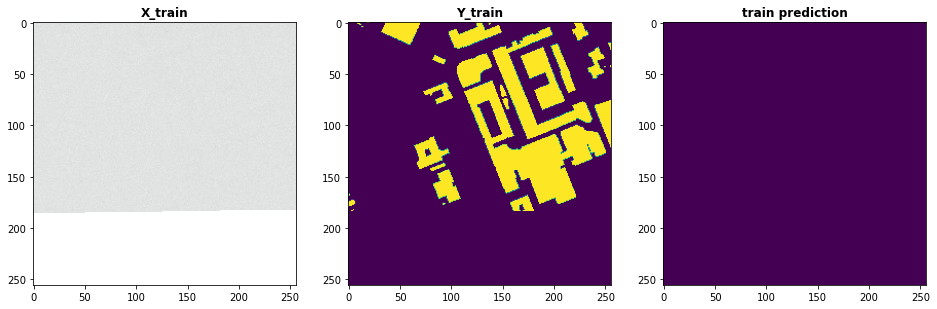

index: 39
val preds  set


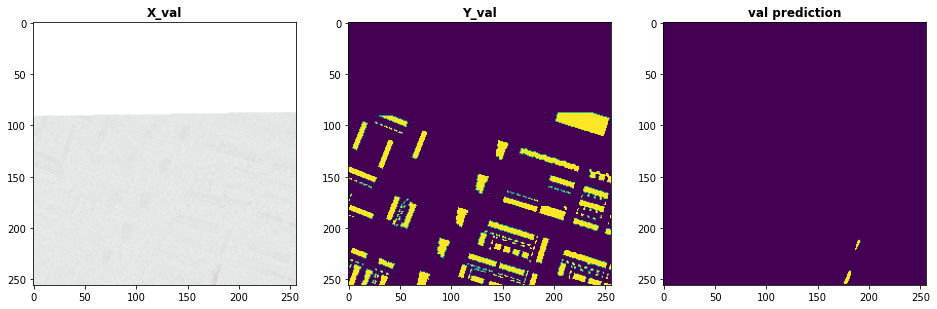

index: 5
test preds  set


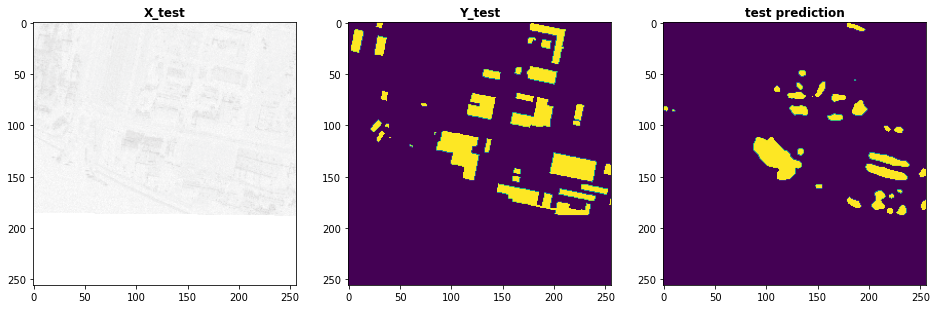

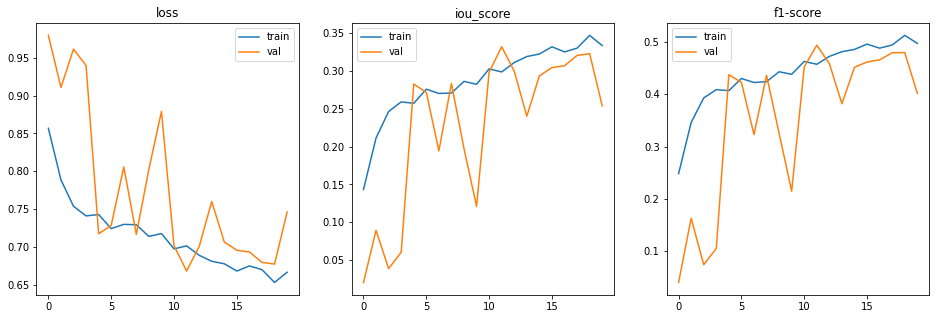

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

##### epoch: 40

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 40

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

Train on 720 samples, validate on 80 samples
Epoch 1/40
720/720 [==============================] - 65s 90ms/step - loss: 0.8762 - iou_score: 0.1238 - f1-score: 0.2181 - val_loss: 0.9888 - val_iou_score: 0.0112 - val_f1-score: 0.0220
Epoch 2/40
720/720 [==============================] - 52s 72ms/step - loss: 0.8004 - iou_score: 0.1996 - f1-score: 0.3298 - val_loss: 0.9143 - val_iou_score: 0.0857 - val_f1-score: 0.1567
Epoch 3/40
720/720 [==============================] - 52s 72ms/step - loss: 0.7615 - iou_score: 0.2385 - f1-score: 0.3821 - val_loss: 0.9924 - val_iou_score: 0.0076 - val_f1-score: 0.0150
Epoch 4/40
720/720 [==============================] - 52s 72ms/step - loss: 0.7513 - iou_score: 0.2487 - f1-score: 0.3960 - val_loss: 0.8238 - val_iou_score: 0.1762 - val_f1-score: 0.2928
Epoch 5/40
720/720 [==============================] - 52s 72ms/step - loss: 0.7405 - iou_score: 0.2595 - f1-score: 0.4095 - val_loss: 0.8152 - val_iou_score: 0.1848 - val_f1-score: 0.2981
Epoch 6/40
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 18ms/step
train set evaluation
720/720 [==============================] - 13s 17ms/step
loss :  0.5683715966012742
iou_score :  0.4317653477191925
f1-score :  0.6009382009506226

validation set evaluation
80/80 [==============================] - 1s 19ms/step
loss :  0.8987700343132019
iou_score :  0.1103612557053566
f1-score :  0.1969199925661087

test set evaluation
80/80 [==============================] - 1s 18ms/step
loss :  0.6045177698135376
iou_score :  0.4070852994918823
f1-score :  0.577413022518158
saved model metrics


index: 706
train preds  set


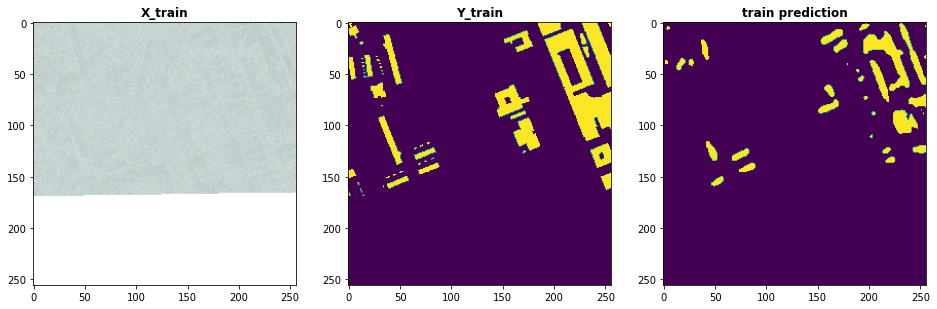

index: 26
val preds  set


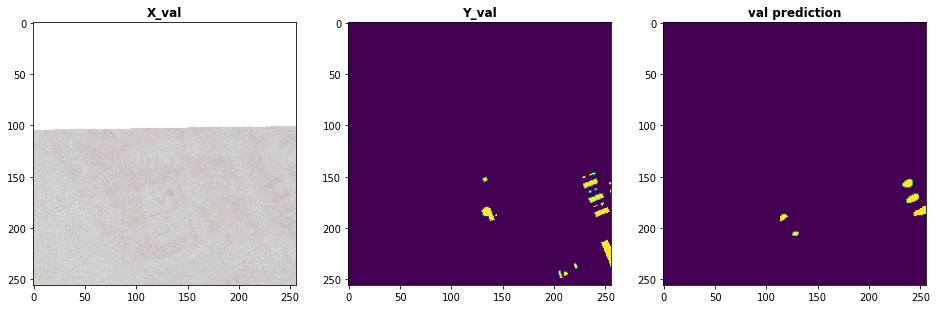

index: 12
test preds  set


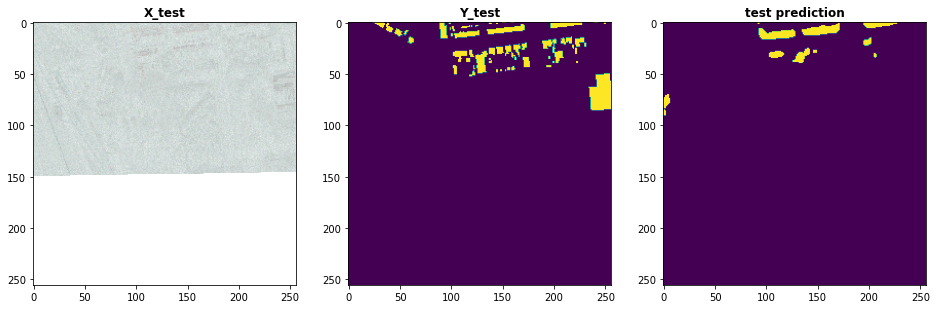

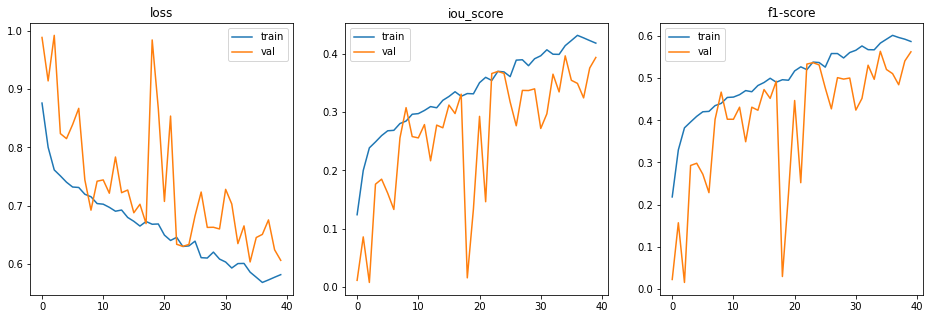

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

##### epoch: 80

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 80

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

Train on 720 samples, validate on 80 samples
Epoch 1/80
720/720 [==============================] - 65s 91ms/step - loss: 0.8569 - iou_score: 0.1431 - f1-score: 0.2484 - val_loss: 1.0000 - val_iou_score: 6.3942e-06 - val_f1-score: 1.2788e-05
Epoch 2/80
720/720 [==============================] - 52s 72ms/step - loss: 0.7838 - iou_score: 0.2162 - f1-score: 0.3534 - val_loss: 1.0000 - val_iou_score: 4.5594e-05 - val_f1-score: 9.1175e-05
Epoch 3/80
720/720 [==============================] - 52s 72ms/step - loss: 0.7599 - iou_score: 0.2401 - f1-score: 0.3847 - val_loss: 0.8007 - val_iou_score: 0.1993 - val_f1-score: 0.3254
Epoch 4/80
720/720 [==============================] - 52s 72ms/step - loss: 0.7474 - iou_score: 0.2526 - f1-score: 0.4007 - val_loss: 0.7332 - val_iou_score: 0.2668 - val_f1-score: 0.4189
Epoch 5/80
720/720 [==============================] - 52s 72ms/step - loss: 0.7346 - iou_score: 0.2654 - f1-score: 0.4176 - val_loss: 0.9915 - val_iou_score: 0.0085 - val_f1-score: 0.0168

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 18ms/step
train set evaluation
720/720 [==============================] - 13s 18ms/step
loss :  0.43618281152513294
iou_score :  0.5637518167495728
f1-score :  0.7199681997299194

validation set evaluation
80/80 [==============================] - 2s 19ms/step
loss :  0.8753885149955749
iou_score :  0.134491965174675
f1-score :  0.23527659475803375

test set evaluation
80/80 [==============================] - 1s 18ms/step
loss :  0.5353565692901612
iou_score :  0.47139155864715576
f1-score :  0.6403853893280029
saved model metrics


index: 157
train preds  set


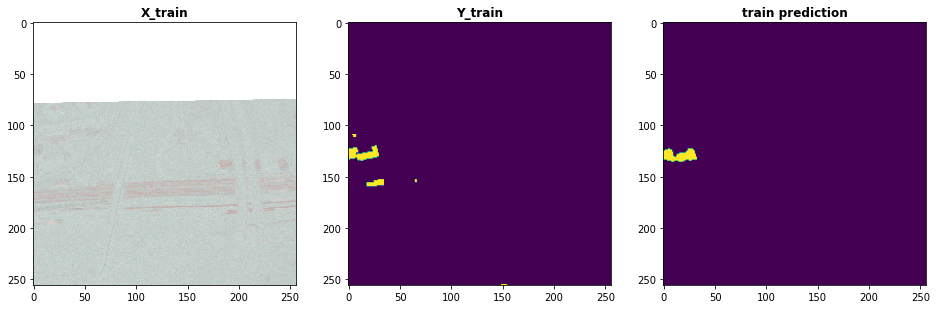

index: 41
val preds  set


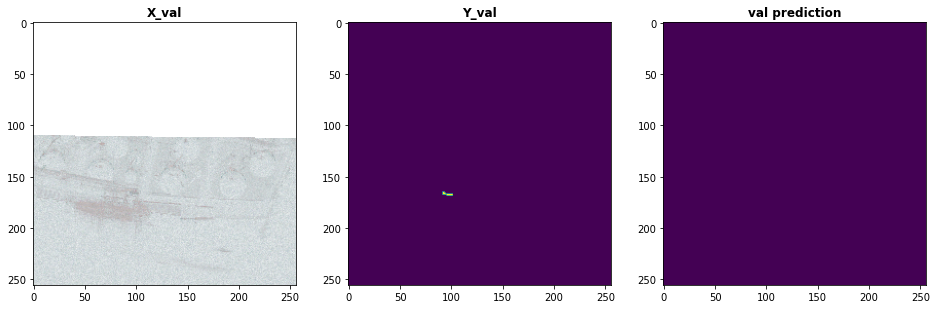

index: 36
test preds  set


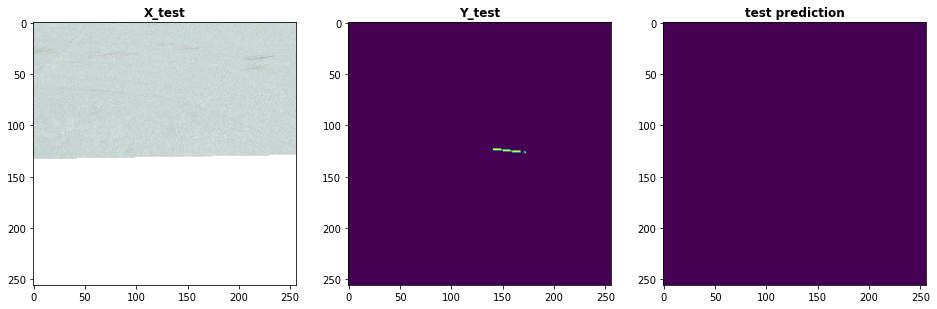

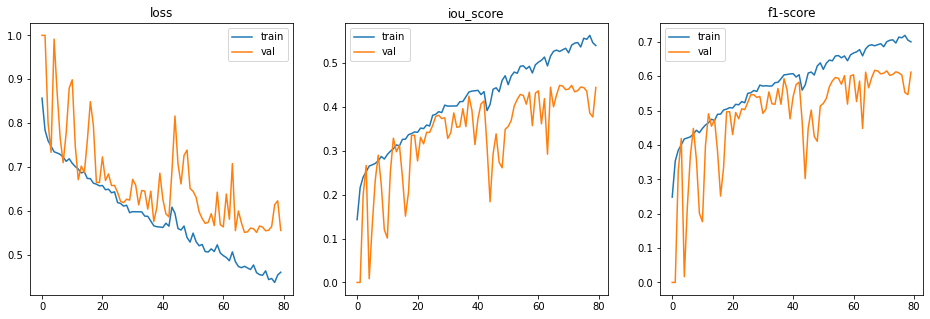

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

#### B --- pretrain: efficientnetb0, loss: jaccardLoss


##### epoch: 20

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb0'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb0', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 182s 253ms/step - loss: 0.8685 - iou_score: 0.1315 - f1-score: 0.2304 - val_loss: 0.9410 - val_iou_score: 0.0590 - val_f1-score: 0.1109
Epoch 2/20
720/720 [==============================] - 118s 164ms/step - loss: 0.8085 - iou_score: 0.1915 - f1-score: 0.3189 - val_loss: 0.9448 - val_iou_score: 0.0552 - val_f1-score: 0.1041
Epoch 3/20
720/720 [==============================] - 118s 164ms/step - loss: 0.7722 - iou_score: 0.2278 - f1-score: 0.3684 - val_loss: 0.9831 - val_iou_score: 0.0169 - val_f1-score: 0.0332
Epoch 4/20
720/720 [==============================] - 118s 164ms/step - loss: 0.7470 - iou_score: 0.2530 - f1-score: 0.4004 - val_loss: 0.9329 - val_iou_score: 0.0671 - val_f1-score: 0.1230
Epoch 5/20
720/720 [==============================] - 118s 164ms/step - loss: 0.7375 - iou_score: 0.2625 - f1-score: 0.4124 - val_loss: 0.9408 - val_iou_score: 0.0592 - val_f1-score: 0.1114
Epoch

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 3s 36ms/step
train set evaluation
720/720 [==============================] - 25s 35ms/step
loss :  0.5940866814719306
iou_score :  0.4063689112663269
f1-score :  0.5770944952964783

validation set evaluation
80/80 [==============================] - 3s 37ms/step
loss :  0.7823997259140014
iou_score :  0.23146818578243256
f1-score :  0.3730808198451996

test set evaluation
80/80 [==============================] - 3s 36ms/step
loss :  0.6132892727851867
iou_score :  0.3890964090824127
f1-score :  0.5597646832466125
saved model metrics


index: 457
train preds  set


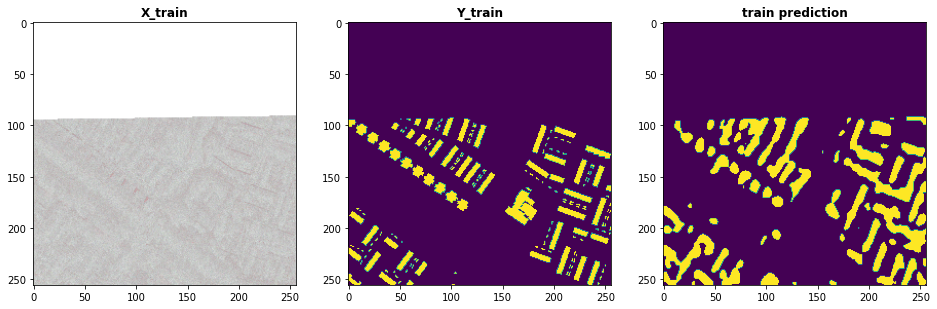

index: 78
val preds  set


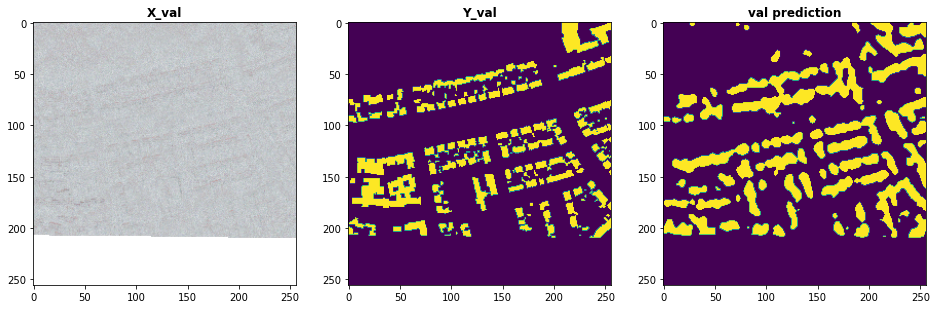

index: 2
test preds  set


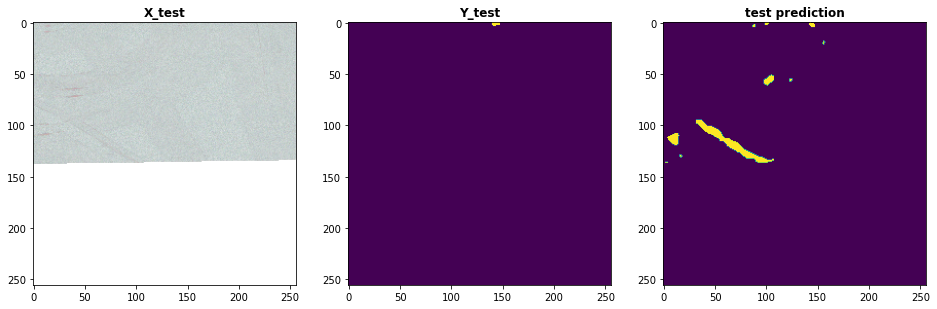

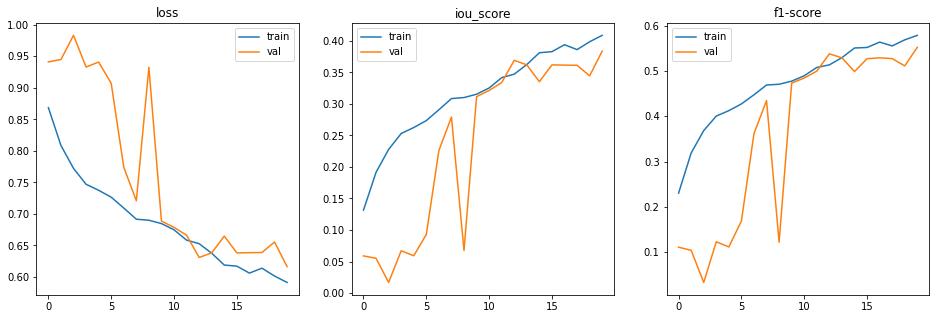

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

##### epoch: 40

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 40

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb0'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb0', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/40
720/720 [==============================] - 86s 119ms/step - loss: 0.8561 - iou_score: 0.1439 - f1-score: 0.2491 - val_loss: 0.8589 - val_iou_score: 0.1411 - val_f1-score: 0.2451
Epoch 2/40
720/720 [==============================] - 61s 85ms/step - loss: 0.7919 - iou_score: 0.2081 - f1-score: 0.3419 - val_loss: 0.9494 - val_iou_score: 0.0506 - val_f1-score: 0.0949
Epoch 3/40
720/720 [==============================] - 61s 85ms/step - loss: 0.7573 - iou_score: 0.2427 - f1-score: 0.3887 - val_loss: 0.8794 - val_iou_score: 0.1206 - val_f1-score: 0.2127
Epoch 4/40
720/720 [==============================] - 61s 85ms/step - loss: 0.7445 - iou_score: 0.2555 - f1-score: 0.4042 - val_loss: 0.8478 - val_iou_score: 0.1522 - val_f1-score: 0.2566
Epoch 5/40
720/720 [==============================] - 61s 85ms/step - loss: 0.7397 - iou_score: 0.2603 - f1-score: 0.4103 - val_loss: 0.9046 - val_iou_score: 0.0954 - val_f1-score: 0.1697
Epoch 6/40
720

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 2s 20ms/step
train set evaluation
720/720 [==============================] - 14s 19ms/step
loss :  0.4579127046797011
iou_score :  0.5424719452857971
f1-score :  0.702511191368103

validation set evaluation
80/80 [==============================] - 2s 21ms/step
loss :  0.8683327198028564
iou_score :  0.1394110471010208
f1-score :  0.24339820444583893

test set evaluation
80/80 [==============================] - 2s 20ms/step
loss :  0.6167916059494019
iou_score :  0.39263880252838135
f1-score :  0.5629931092262268
saved model metrics


index: 0
train preds  set


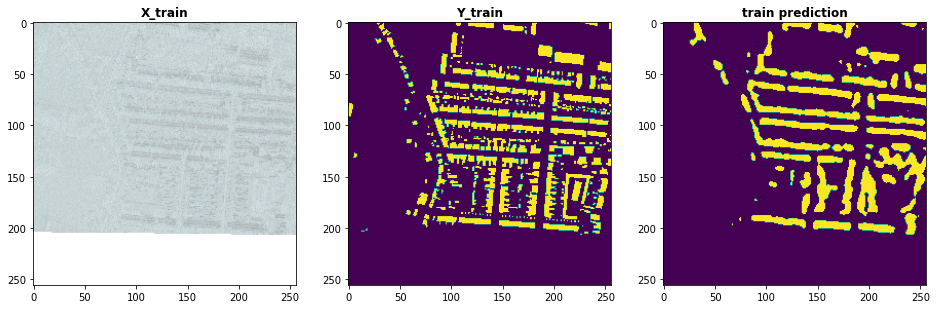

index: 55
val preds  set


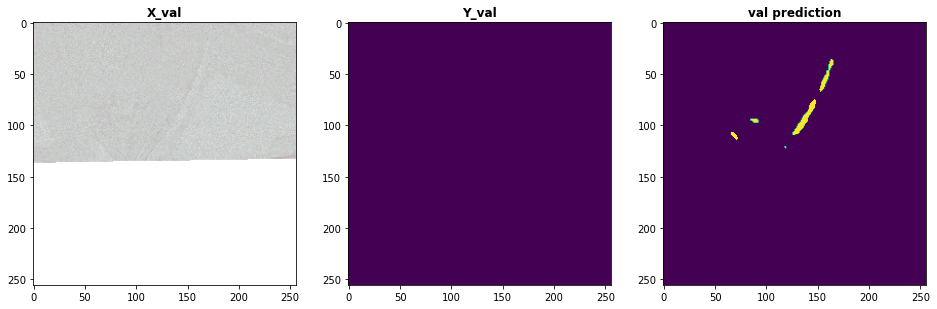

index: 1
test preds  set


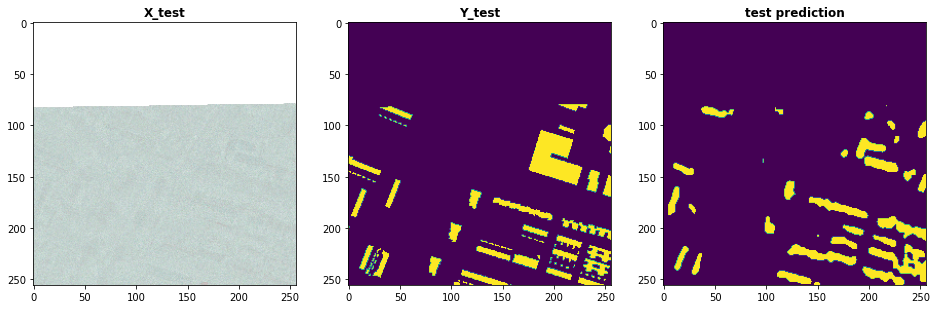

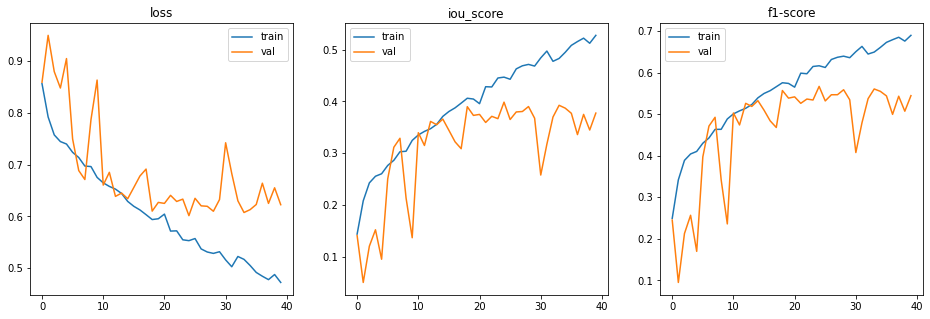

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

##### epoch: 80

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 80

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb0'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb0', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/80
720/720 [==============================] - 84s 116ms/step - loss: 0.8927 - iou_score: 0.1073 - f1-score: 0.1920 - val_loss: 0.8834 - val_iou_score: 0.1166 - val_f1-score: 0.2071
Epoch 2/80
720/720 [==============================] - 61s 85ms/step - loss: 0.8363 - iou_score: 0.1637 - f1-score: 0.2792 - val_loss: 0.8387 - val_iou_score: 0.1613 - val_f1-score: 0.2756
Epoch 3/80
720/720 [==============================] - 61s 85ms/step - loss: 0.7843 - iou_score: 0.2157 - f1-score: 0.3530 - val_loss: 0.8725 - val_iou_score: 0.1275 - val_f1-score: 0.2241
Epoch 4/80
720/720 [==============================] - 61s 85ms/step - loss: 0.7412 - iou_score: 0.2588 - f1-score: 0.4085 - val_loss: 0.9890 - val_iou_score: 0.0110 - val_f1-score: 0.0218
Epoch 5/80
720/720 [==============================] - 61s 85ms/step - loss: 0.7235 - iou_score: 0.2765 - f1-score: 0.4311 - val_loss: 0.9939 - val_iou_score: 0.0061 - val_f1-score: 0.0121
Epoch 6/80
720

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 2s 20ms/step
train set evaluation
720/720 [==============================] - 14s 19ms/step
loss :  0.32109522289699977
iou_score :  0.6787658333778381
f1-score :  0.8081984519958496

validation set evaluation
80/80 [==============================] - 2s 21ms/step
loss :  0.8542429327964782
iou_score :  0.15691708028316498
f1-score :  0.26890674233436584

test set evaluation
80/80 [==============================] - 2s 20ms/step
loss :  0.6228885889053345
iou_score :  0.38355016708374023
f1-score :  0.5540411472320557
saved model metrics


index: 247
train preds  set


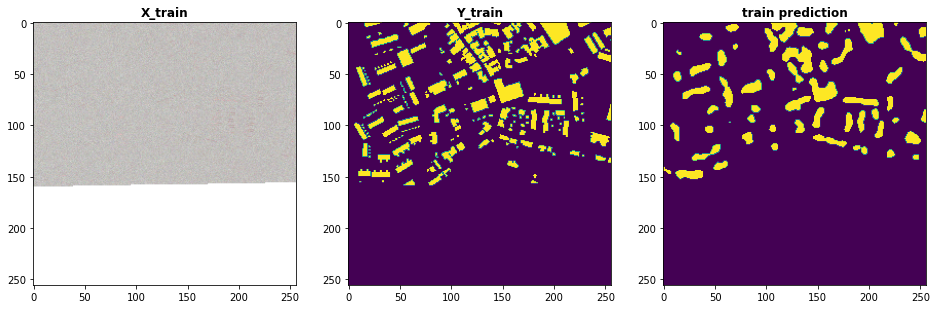

index: 66
val preds  set


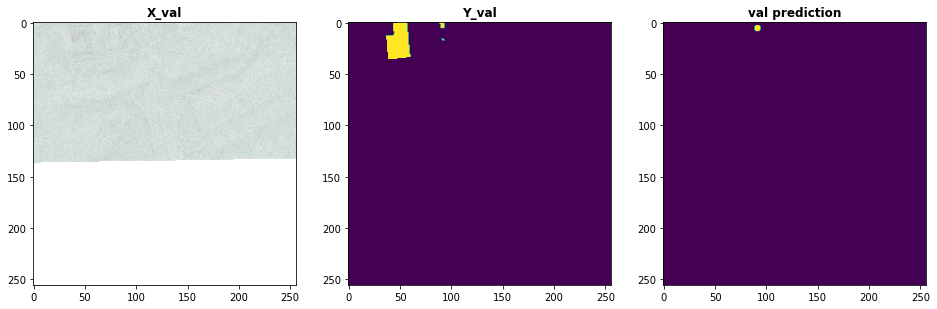

index: 14
test preds  set


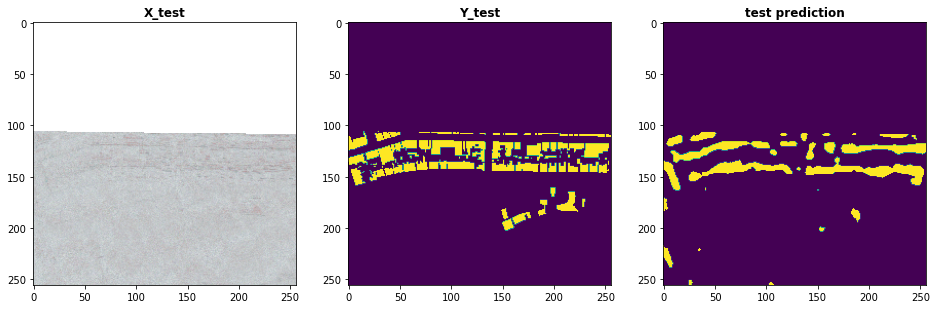

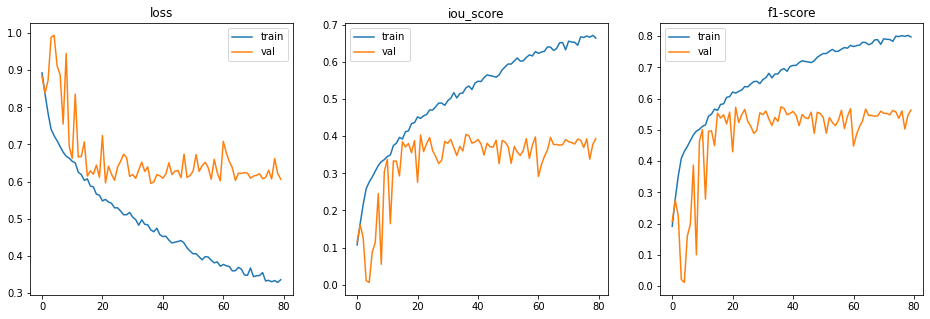

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

#### C --- pretrain: resnet34, loss: BinaryFocalLoss(alpha=0.25, gamma=2.0)   (default)


##### epoch: 20

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss(alpha=0.25, gamma=2.0)
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss(alpha=0.25, gamma=2.0)'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 39s 54ms/step - loss: 0.0221 - iou_score: 0.0735 - f1-score: 0.1365 - val_loss: 0.3865 - val_iou_score: 0.0037 - val_f1-score: 0.0073
Epoch 2/20
720/720 [==============================] - 18s 25ms/step - loss: 0.0177 - iou_score: 0.0878 - f1-score: 0.1609 - val_loss: 0.2775 - val_iou_score: 0.0158 - val_f1-score: 0.0311
Epoch 3/20
720/720 [==============================] - 18s 25ms/step - loss: 0.0172 - iou_score: 0.0913 - f1-score: 0.1668 - val_loss: 0.0493 - val_iou_score: 0.0829 - val_f1-score: 0.1523
Epoch 4/20
720/720 [==============================] - 18s 25ms/step - loss: 0.0170 - iou_score: 0.0959 - f1-score: 0.1747 - val_loss: 0.0221 - val_iou_score: 0.1082 - val_f1-score: 0.1944
Epoch 5/20
720/720 [==============================] - 18s 26ms/step - loss: 0.0165 - iou_score: 0.1010 - f1-score: 0.1831 - val_loss: 0.0232 - val_iou_score: 0.1094 - val_f1-score: 0.1963
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 7ms/step
train set evaluation
720/720 [==============================] - 5s 7ms/step
loss :  0.029278675301207438
iou_score :  0.11770200729370117
f1-score :  0.20998850464820862

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  17.606628036499025
iou_score :  0.15156440436840057
f1-score :  0.2613442540168762

test set evaluation
80/80 [==============================] - 1s 7ms/step
loss :  0.029215511679649354
iou_score :  0.13021530210971832
f1-score :  0.23035307228565216
saved model metrics


index: 256
train preds  set


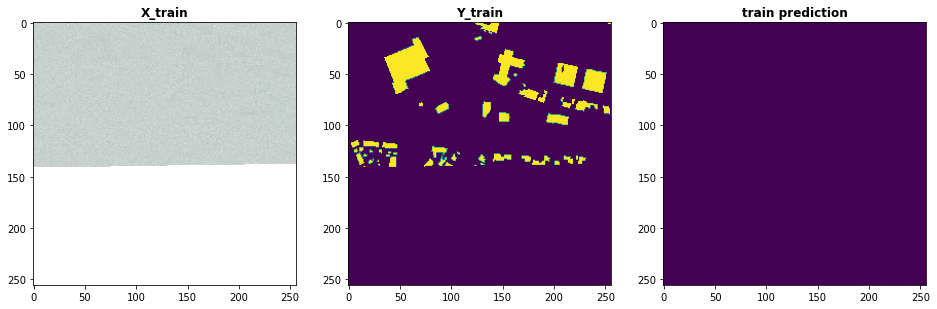

index: 51
val preds  set


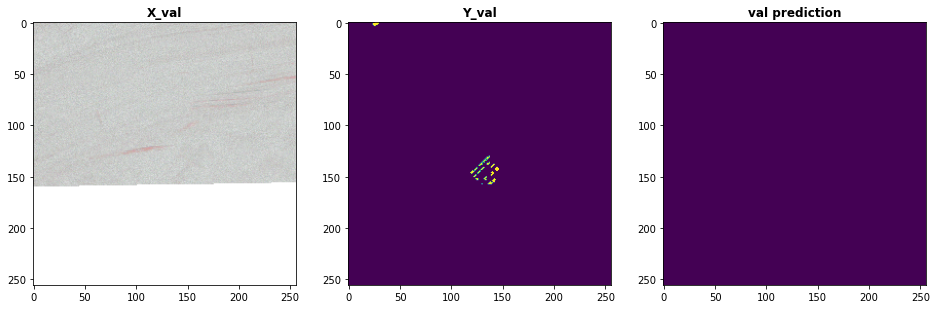

index: 9
test preds  set


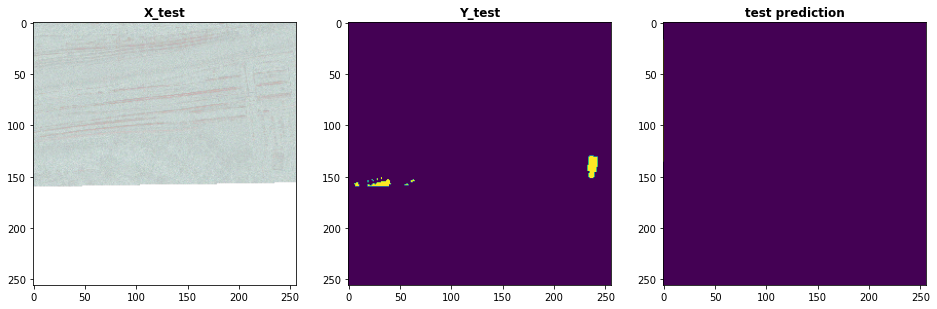

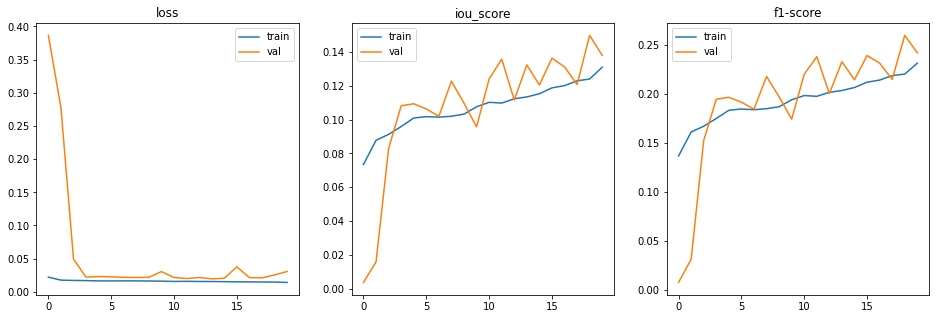

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

##### epoch: 40

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss(alpha=0.25, gamma=2.0)
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 40

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss(alpha=0.25, gamma=2.0)'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

model.load_weights(PATH_SAVED_MODELS/'MODEL_segmentation-models Unet__PRETRAIN_resnet34__LOSS_BinaryFocalLoss(alpha=0.25, gamma=2.0)__EPOCH_20__TRAIN_800__TEST_80_WEIGHTS.h5')
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=20, validation_split=MODEL_VAL_SPLIT)
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 29s 41ms/step - loss: 0.0143 - iou_score: 0.1323 - f1-score: 0.2331 - val_loss: 0.0252 - val_iou_score: 0.1580 - val_f1-score: 0.2718
Epoch 2/20
720/720 [==============================] - 19s 26ms/step - loss: 0.0140 - iou_score: 0.1373 - f1-score: 0.2407 - val_loss: 0.0177 - val_iou_score: 0.1577 - val_f1-score: 0.2711
Epoch 3/20
720/720 [==============================] - 19s 26ms/step - loss: 0.0143 - iou_score: 0.1343 - f1-score: 0.2362 - val_loss: 0.0517 - val_iou_score: 0.1438 - val_f1-score: 0.2503
Epoch 4/20
720/720 [==============================] - 19s 26ms/step - loss: 0.0143 - iou_score: 0.1333 - f1-score: 0.2345 - val_loss: 0.0185 - val_iou_score: 0.1442 - val_f1-score: 0.2508
Epoch 5/20
720/720 [==============================] - 19s 26ms/step - loss: 0.0140 - iou_score: 0.1388 - f1-score: 0.2431 - val_loss: 0.0205 - val_iou_score: 0.1627 - val_f1-score: 0.2788
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 7ms/step
train set evaluation
720/720 [==============================] - 5s 7ms/step
loss :  0.010407721975611316
iou_score :  0.2024240344762802
f1-score :  0.3363272547721863

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  8.506752872467041
iou_score :  0.2207106351852417
f1-score :  0.35917234420776367

test set evaluation
80/80 [==============================] - 1s 7ms/step
loss :  0.01358033362776041
iou_score :  0.1996850222349167
f1-score :  0.3326992690563202
saved model metrics


index: 283
train preds  set


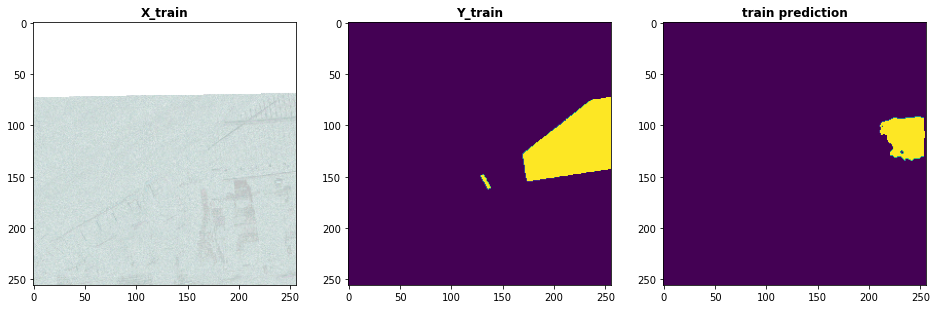

index: 63
val preds  set


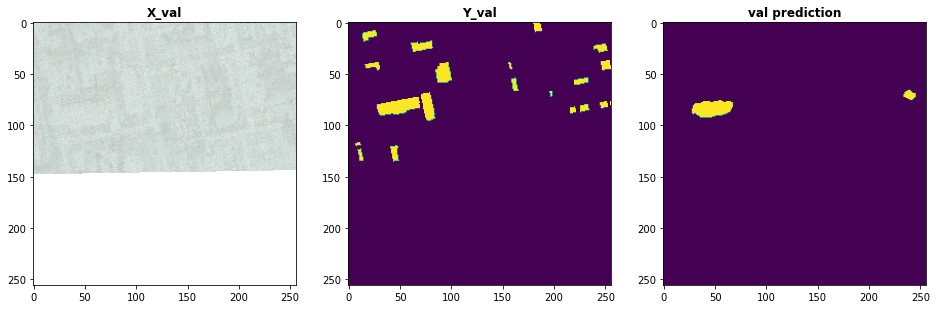

index: 33
test preds  set


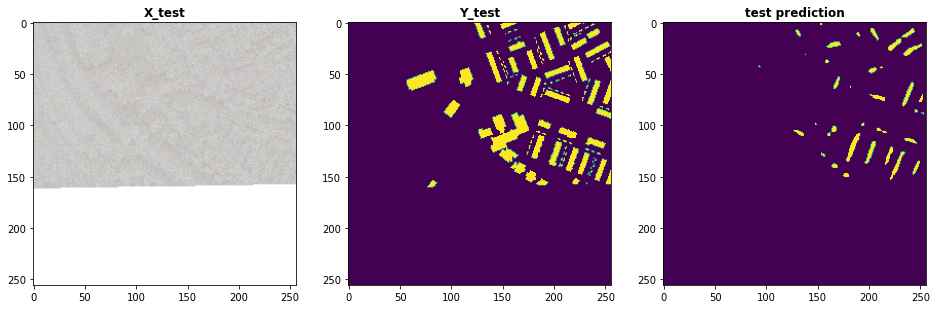

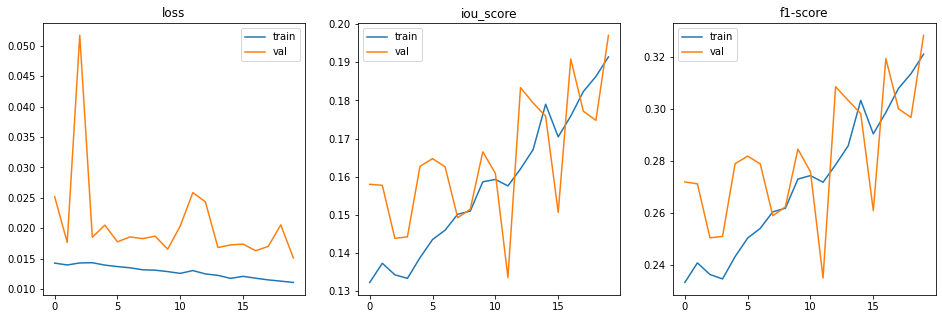

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

#### D --- pretrain: efficientnetb0, loss: BinaryFocalLoss(alpha=0.25, gamma=2.0) (default)


##### epoch: 20

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss(alpha=0.25, gamma=2.0)
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb0'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss(alpha=0.25, gamma=2.0)'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb0', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 47s 66ms/step - loss: 0.0281 - iou_score: 0.0672 - f1-score: 0.1256 - val_loss: 0.0383 - val_iou_score: 0.0721 - val_f1-score: 0.1338
Epoch 2/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0186 - iou_score: 0.0814 - f1-score: 0.1503 - val_loss: 0.0259 - val_iou_score: 0.0865 - val_f1-score: 0.1585
Epoch 3/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0179 - iou_score: 0.0876 - f1-score: 0.1607 - val_loss: 0.0239 - val_iou_score: 0.0844 - val_f1-score: 0.1549
Epoch 4/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0175 - iou_score: 0.0913 - f1-score: 0.1668 - val_loss: 0.0371 - val_iou_score: 0.0589 - val_f1-score: 0.1111
Epoch 5/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0171 - iou_score: 0.0957 - f1-score: 0.1744 - val_loss: 0.0305 - val_iou_score: 0.0785 - val_f1-score: 0.1452
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 6s 8ms/step
loss :  0.016966159145037334
iou_score :  0.1511254608631134
f1-score :  0.26218724250793457

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  4.5670655250549315
iou_score :  0.3572166860103607
f1-score :  0.5249630808830261

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.021791254356503486
iou_score :  0.14752787351608276
f1-score :  0.2567022740840912
saved model metrics


index: 673
train preds  set


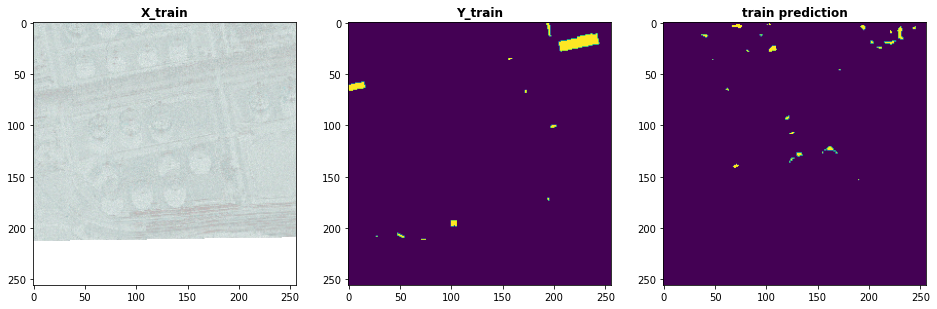

index: 29
val preds  set


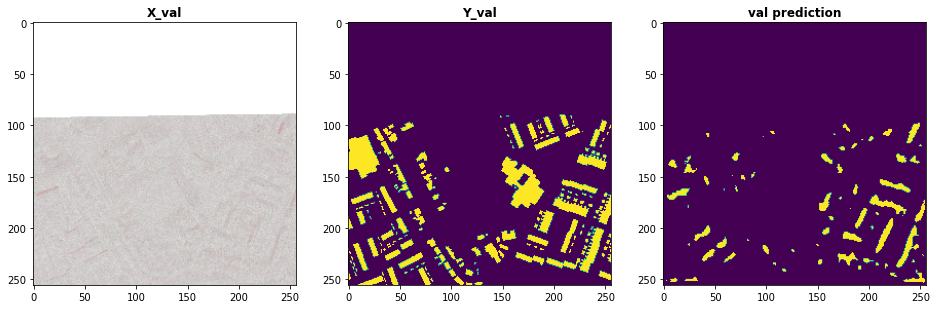

index: 66
test preds  set


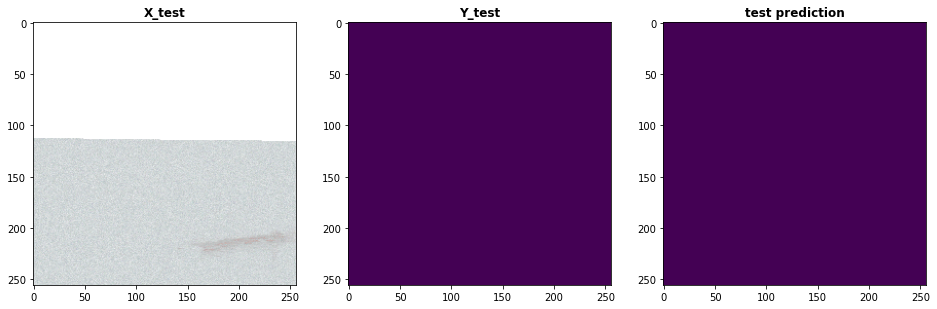

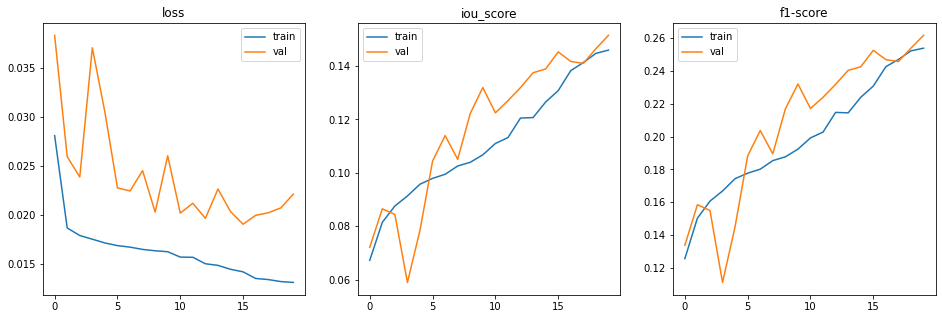

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

##### epoch: 40

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss(alpha=0.25, gamma=2.0)
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 40

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb0'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss(alpha=0.25, gamma=2.0)'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb0', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

model.load_weights(PATH_SAVED_MODELS/'MODEL_segmentation-models Unet__PRETRAIN_efficientnetb0__LOSS_BinaryFocalLoss(alpha=0.25, gamma=2.0)__EPOCH_20__TRAIN_800__TEST_80_WEIGHTS.h5')
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=20, validation_split=MODEL_VAL_SPLIT)
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 44s 61ms/step - loss: 0.0129 - iou_score: 0.1506 - f1-score: 0.2611 - val_loss: 0.0204 - val_iou_score: 0.1512 - val_f1-score: 0.2612
Epoch 2/20
720/720 [==============================] - 25s 35ms/step - loss: 0.0126 - iou_score: 0.1581 - f1-score: 0.2720 - val_loss: 0.0209 - val_iou_score: 0.1451 - val_f1-score: 0.2520
Epoch 3/20
720/720 [==============================] - 25s 35ms/step - loss: 0.0125 - iou_score: 0.1589 - f1-score: 0.2735 - val_loss: 0.0246 - val_iou_score: 0.1324 - val_f1-score: 0.2328
Epoch 4/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0126 - iou_score: 0.1595 - f1-score: 0.2741 - val_loss: 0.0232 - val_iou_score: 0.1337 - val_f1-score: 0.2343
Epoch 5/20
720/720 [==============================] - 26s 35ms/step - loss: 0.0121 - iou_score: 0.1660 - f1-score: 0.2835 - val_loss: 0.0203 - val_iou_score: 0.1554 - val_f1-score: 0.2676
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 6s 8ms/step
loss :  0.009087070036265585
iou_score :  0.2666214108467102
f1-score :  0.42052170634269714

validation set evaluation
80/80 [==============================] - 1s 9ms/step
loss :  9.779751777648926
iou_score :  0.20466184616088867
f1-score :  0.3381113111972809

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.019558287039399148
iou_score :  0.187056764960289
f1-score :  0.3147529363632202
saved model metrics


index: 73
train preds  set


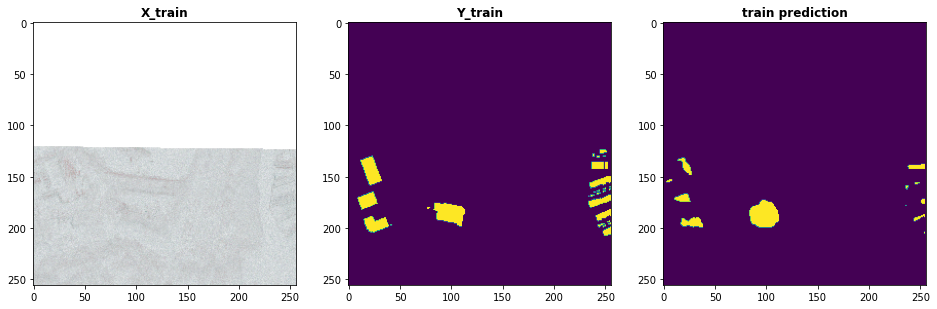

index: 55
val preds  set


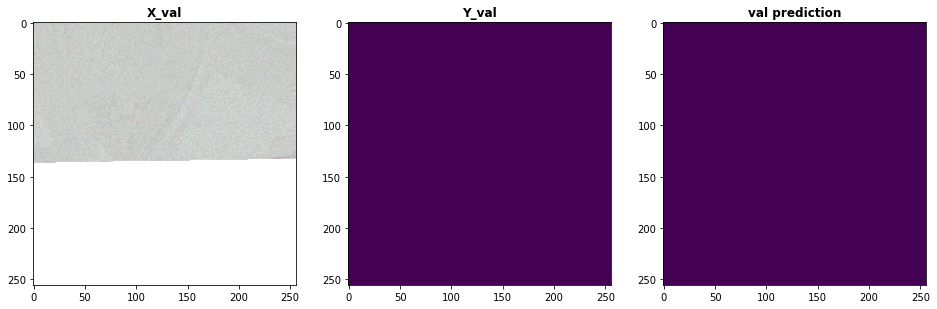

index: 47
test preds  set


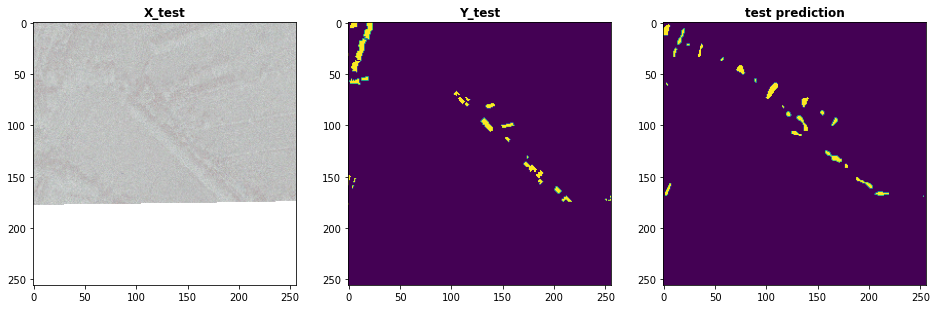

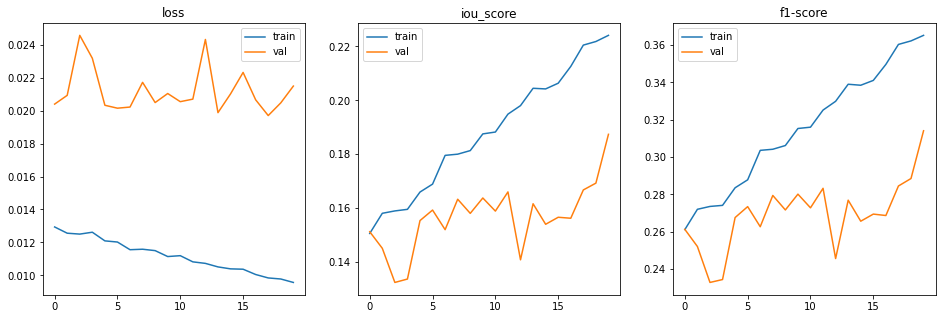

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### Rotation

In [ ]:
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: True, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/S

#### A --- pretrain: resnet34, loss: jaccardLoss


##### epoch: 20

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 66s 92ms/step - loss: 0.8758 - iou_score: 0.1242 - f1-score: 0.2191 - val_loss: 0.9119 - val_iou_score: 0.0881 - val_f1-score: 0.1608
Epoch 2/20
720/720 [==============================] - 52s 72ms/step - loss: 0.8076 - iou_score: 0.1924 - f1-score: 0.3208 - val_loss: 0.9985 - val_iou_score: 0.0015 - val_f1-score: 0.0031
Epoch 3/20
720/720 [==============================] - 52s 72ms/step - loss: 0.7702 - iou_score: 0.2298 - f1-score: 0.3713 - val_loss: 0.9843 - val_iou_score: 0.0157 - val_f1-score: 0.0302
Epoch 4/20
720/720 [==============================] - 52s 72ms/step - loss: 0.7487 - iou_score: 0.2513 - f1-score: 0.3988 - val_loss: 0.9935 - val_iou_score: 0.0065 - val_f1-score: 0.0129
Epoch 5/20
720/720 [==============================] - 52s 73ms/step - loss: 0.7447 - iou_score: 0.2553 - f1-score: 0.4042 - val_loss: 0.8803 - val_iou_score: 0.1197 - val_f1-score: 0.1959
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 18ms/step
train set evaluation
720/720 [==============================] - 13s 18ms/step
loss :  0.6796235190497504
iou_score :  0.3208788335323334
f1-score :  0.48391130566596985

validation set evaluation
80/80 [==============================] - 2s 19ms/step
loss :  0.8336524248123169
iou_score :  0.17737261950969696
f1-score :  0.29913416504859924

test set evaluation
80/80 [==============================] - 1s 18ms/step
loss :  0.6541540741920471
iou_score :  0.3527165949344635
f1-score :  0.5208074450492859
saved model metrics


index: 416
train preds  set


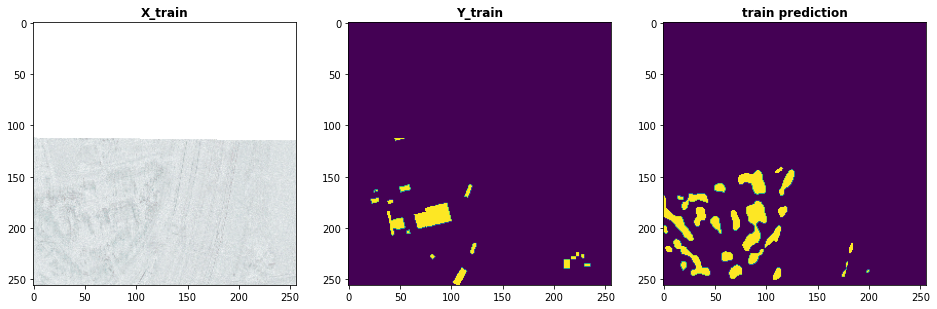

index: 14
val preds  set


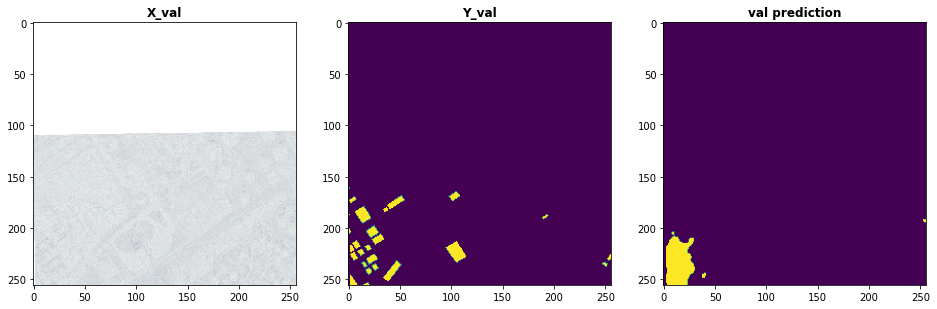

index: 75
test preds  set


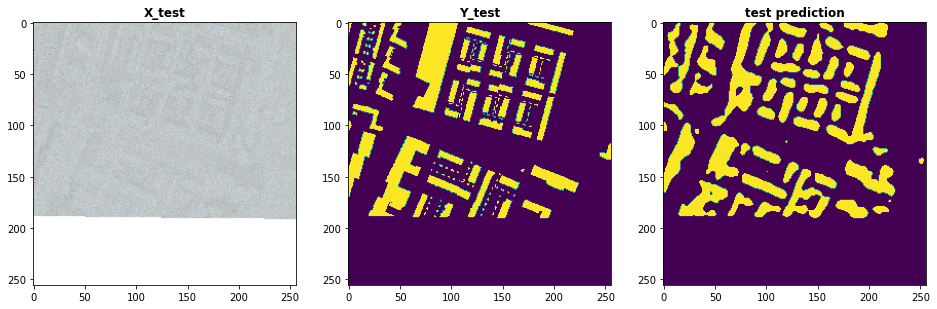

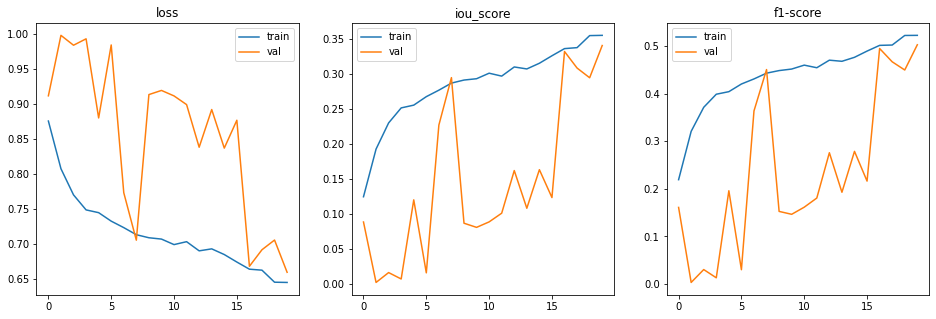

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

##### epoch: 40

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 40

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

Train on 720 samples, validate on 80 samples
Epoch 1/40
720/720 [==============================] - 65s 91ms/step - loss: 0.8524 - iou_score: 0.1476 - f1-score: 0.2550 - val_loss: 0.9964 - val_iou_score: 0.0036 - val_f1-score: 0.0072
Epoch 2/40
720/720 [==============================] - 52s 72ms/step - loss: 0.7804 - iou_score: 0.2196 - f1-score: 0.3578 - val_loss: 0.9973 - val_iou_score: 0.0027 - val_f1-score: 0.0054
Epoch 3/40
720/720 [==============================] - 52s 72ms/step - loss: 0.7629 - iou_score: 0.2371 - f1-score: 0.3802 - val_loss: 0.9346 - val_iou_score: 0.0654 - val_f1-score: 0.1182
Epoch 4/40
720/720 [==============================] - 52s 72ms/step - loss: 0.7537 - iou_score: 0.2463 - f1-score: 0.3917 - val_loss: 0.9124 - val_iou_score: 0.0876 - val_f1-score: 0.1463
Epoch 5/40
720/720 [==============================] - 52s 72ms/step - loss: 0.7335 - iou_score: 0.2665 - f1-score: 0.4183 - val_loss: 0.7101 - val_iou_score: 0.2899 - val_f1-score: 0.4457
Epoch 6/40
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 18ms/step
train set evaluation
720/720 [==============================] - 13s 18ms/step
loss :  0.5498824569914076
iou_score :  0.45031559467315674
f1-score :  0.6193953156471252

validation set evaluation
80/80 [==============================] - 2s 19ms/step
loss :  0.8711304664611816
iou_score :  0.13596056401729584
f1-score :  0.23846334218978882

test set evaluation
80/80 [==============================] - 1s 18ms/step
loss :  0.5831015110015869
iou_score :  0.42276060581207275
f1-score :  0.5939583778381348
saved model metrics


index: 511
train preds  set


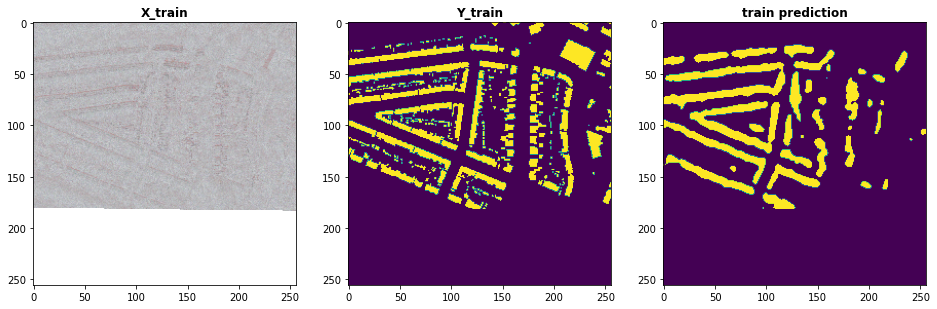

index: 55
val preds  set


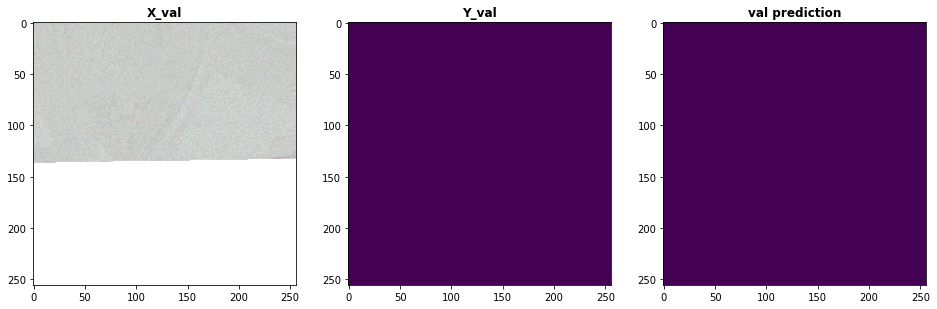

index: 63
test preds  set


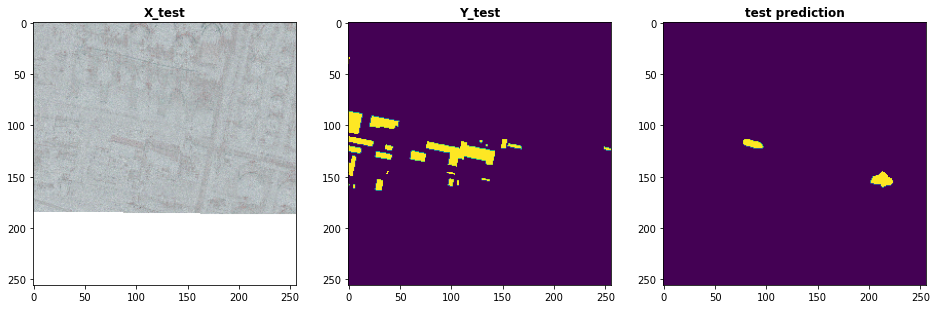

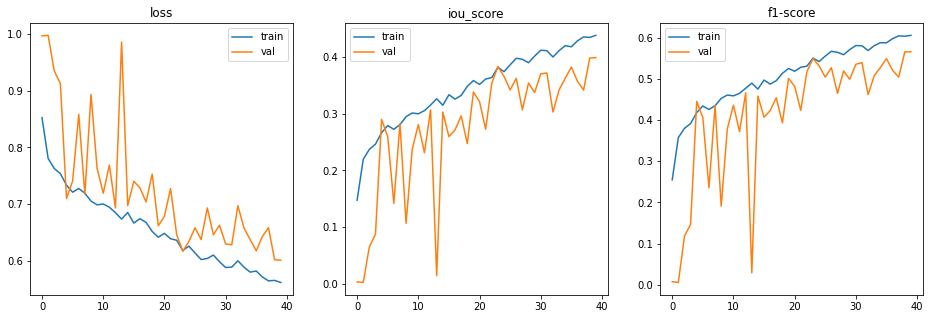

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

##### epoch: 80

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 80

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

Train on 720 samples, validate on 80 samples
Epoch 1/80
720/720 [==============================] - 66s 91ms/step - loss: 0.8612 - iou_score: 0.1388 - f1-score: 0.2413 - val_loss: 0.9993 - val_iou_score: 6.9160e-04 - val_f1-score: 0.0014
Epoch 2/80
720/720 [==============================] - 52s 72ms/step - loss: 0.7854 - iou_score: 0.2146 - f1-score: 0.3511 - val_loss: 0.9088 - val_iou_score: 0.0912 - val_f1-score: 0.1660
Epoch 3/80
720/720 [==============================] - 52s 72ms/step - loss: 0.7667 - iou_score: 0.2333 - f1-score: 0.3753 - val_loss: 0.8978 - val_iou_score: 0.1022 - val_f1-score: 0.1836
Epoch 4/80
720/720 [==============================] - 52s 72ms/step - loss: 0.7548 - iou_score: 0.2452 - f1-score: 0.3901 - val_loss: 0.8597 - val_iou_score: 0.1403 - val_f1-score: 0.2433
Epoch 5/80
720/720 [==============================] - 52s 72ms/step - loss: 0.7414 - iou_score: 0.2586 - f1-score: 0.4082 - val_loss: 0.8968 - val_iou_score: 0.1032 - val_f1-score: 0.1850
Epoch 6/80


In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 18ms/step
train set evaluation
720/720 [==============================] - 13s 17ms/step
loss :  0.4408006323708428
iou_score :  0.5581443905830383
f1-score :  0.7152903079986572

validation set evaluation
80/80 [==============================] - 2s 19ms/step
loss :  0.9046401262283326
iou_score :  0.10165318101644516
f1-score :  0.18359990417957306

test set evaluation
80/80 [==============================] - 1s 18ms/step
loss :  0.55853111743927
iou_score :  0.44976016879081726
f1-score :  0.6198499798774719
saved model metrics


index: 49
train preds  set


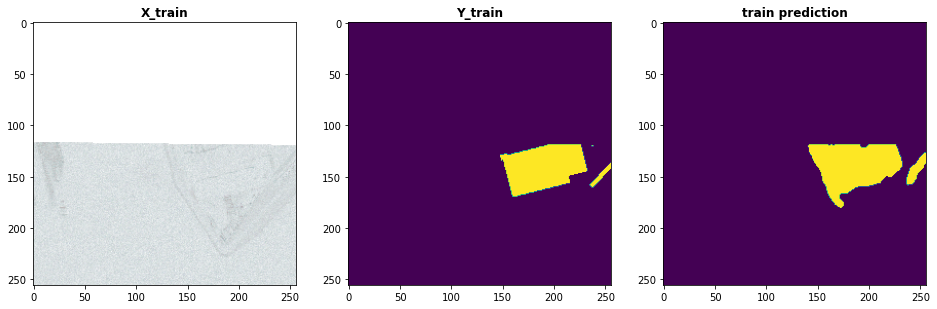

index: 25
val preds  set


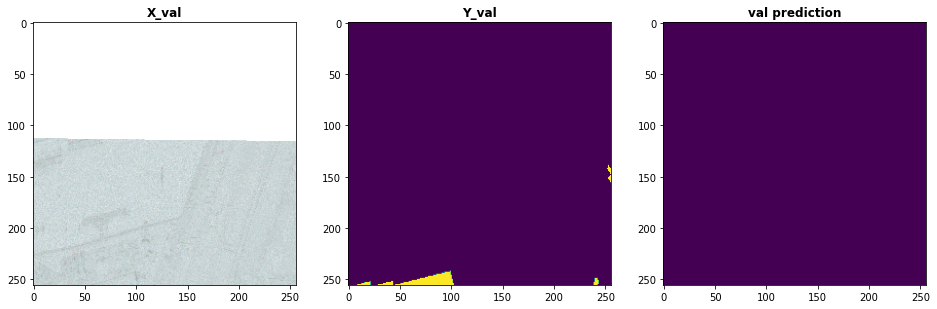

index: 65
test preds  set


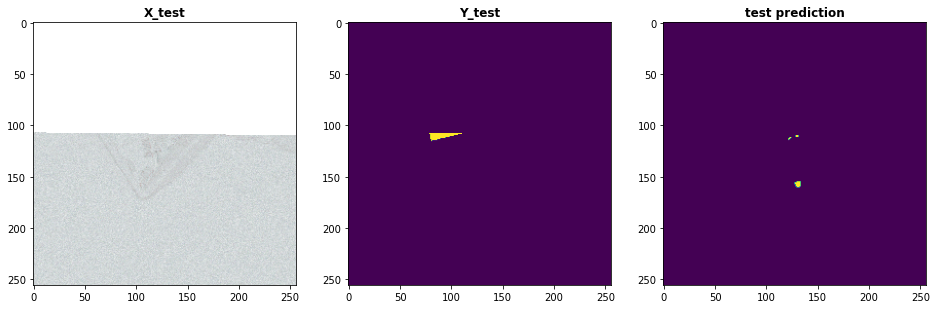

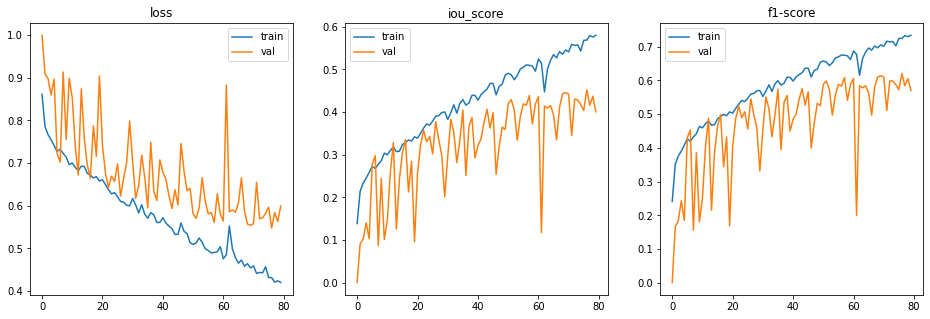

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

#### B --- pretrain: efficientnetb0, loss: jaccardLoss


##### epoch: 20

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb0'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb0', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 83s 115ms/step - loss: 0.8573 - iou_score: 0.1427 - f1-score: 0.2458 - val_loss: 0.8839 - val_iou_score: 0.1161 - val_f1-score: 0.2066
Epoch 2/20
720/720 [==============================] - 62s 85ms/step - loss: 0.7829 - iou_score: 0.2171 - f1-score: 0.3543 - val_loss: 0.8712 - val_iou_score: 0.1288 - val_f1-score: 0.2267
Epoch 3/20
720/720 [==============================] - 62s 85ms/step - loss: 0.7515 - iou_score: 0.2485 - f1-score: 0.3962 - val_loss: 0.9541 - val_iou_score: 0.0459 - val_f1-score: 0.0877
Epoch 4/20
720/720 [==============================] - 62s 86ms/step - loss: 0.7338 - iou_score: 0.2662 - f1-score: 0.4175 - val_loss: 0.9177 - val_iou_score: 0.0823 - val_f1-score: 0.1519
Epoch 5/20
720/720 [==============================] - 62s 85ms/step - loss: 0.7142 - iou_score: 0.2858 - f1-score: 0.4426 - val_loss: 0.8578 - val_iou_score: 0.1422 - val_f1-score: 0.2472
Epoch 6/20
720

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 2s 20ms/step
train set evaluation
720/720 [==============================] - 14s 20ms/step
loss :  0.7897487084070841
iou_score :  0.21084514260292053
f1-score :  0.3462311029434204

validation set evaluation
80/80 [==============================] - 2s 21ms/step
loss :  0.3488049149513245
iou_score :  0.6964675784111023
f1-score :  0.8099601864814758

test set evaluation
80/80 [==============================] - 2s 20ms/step
loss :  0.7983986020088196
iou_score :  0.19919772446155548
f1-score :  0.331353098154068
saved model metrics


index: 556
train preds  set


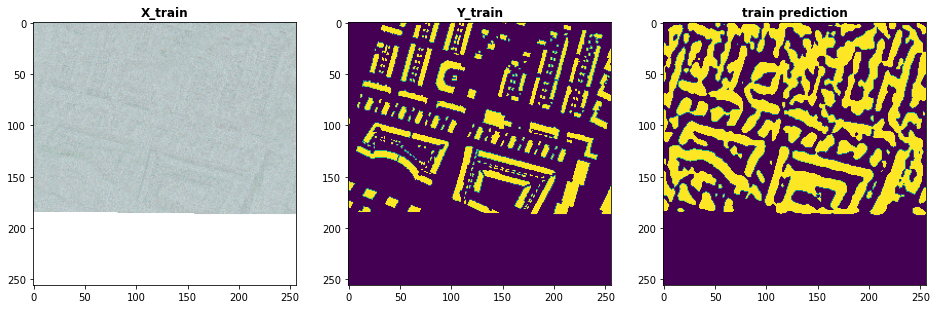

index: 59
val preds  set


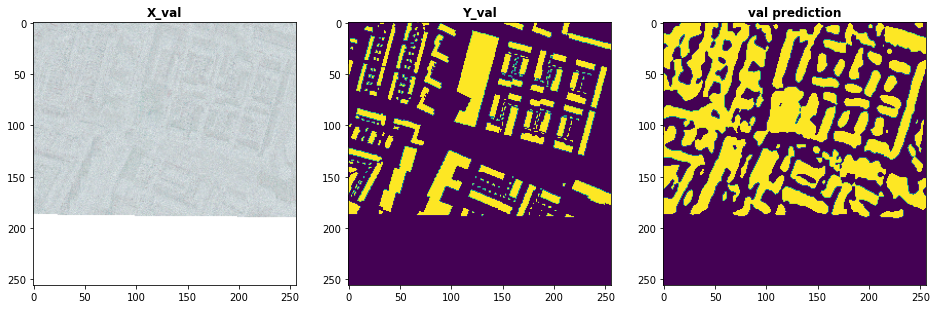

index: 66
test preds  set


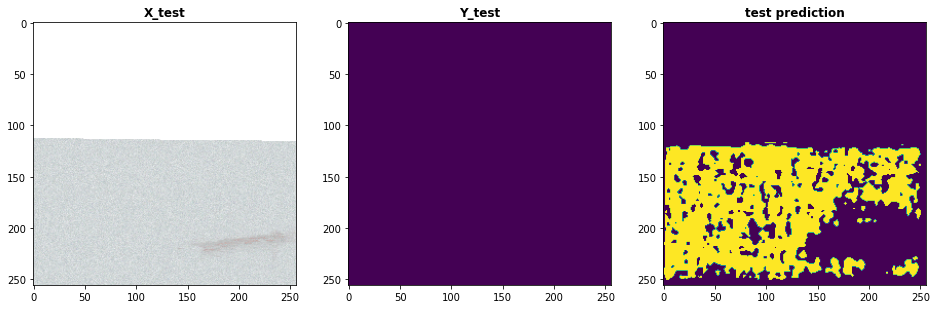

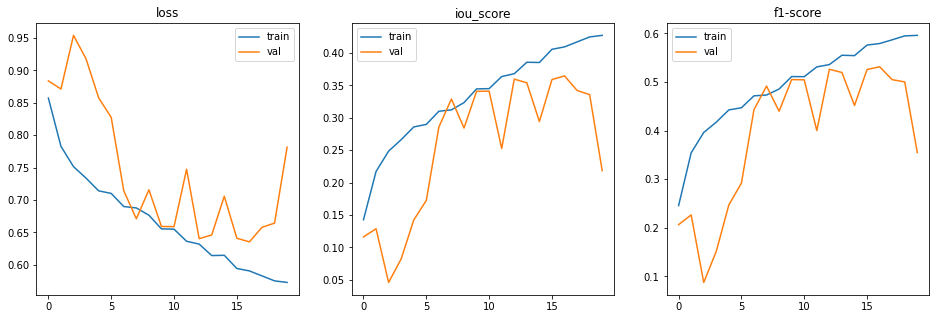

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

##### epoch: 40

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 40

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb0'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb0', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/40
720/720 [==============================] - 84s 116ms/step - loss: 0.8679 - iou_score: 0.1321 - f1-score: 0.2313 - val_loss: 0.9135 - val_iou_score: 0.0865 - val_f1-score: 0.1581
Epoch 2/40
720/720 [==============================] - 62s 86ms/step - loss: 0.8031 - iou_score: 0.1969 - f1-score: 0.3265 - val_loss: 0.9244 - val_iou_score: 0.0756 - val_f1-score: 0.1400
Epoch 3/40
720/720 [==============================] - 62s 86ms/step - loss: 0.7670 - iou_score: 0.2330 - f1-score: 0.3755 - val_loss: 0.9972 - val_iou_score: 0.0028 - val_f1-score: 0.0056
Epoch 4/40
720/720 [==============================] - 61s 85ms/step - loss: 0.7408 - iou_score: 0.2592 - f1-score: 0.4096 - val_loss: 0.9525 - val_iou_score: 0.0475 - val_f1-score: 0.0899
Epoch 5/40
720/720 [==============================] - 62s 86ms/step - loss: 0.7232 - iou_score: 0.2768 - f1-score: 0.4321 - val_loss: 0.8146 - val_iou_score: 0.1854 - val_f1-score: 0.3092
Epoch 6/40
720

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 2s 20ms/step
train set evaluation
720/720 [==============================] - 14s 19ms/step
loss :  0.4253087719281515
iou_score :  0.5748127698898315
f1-score :  0.7293268442153931

validation set evaluation
80/80 [==============================] - 2s 21ms/step
loss :  0.8897489070892334
iou_score :  0.11904682964086533
f1-score :  0.2109738141298294

test set evaluation
80/80 [==============================] - 2s 20ms/step
loss :  0.6199499130249023
iou_score :  0.38591739535331726
f1-score :  0.5565839409828186
saved model metrics


index: 90
train preds  set


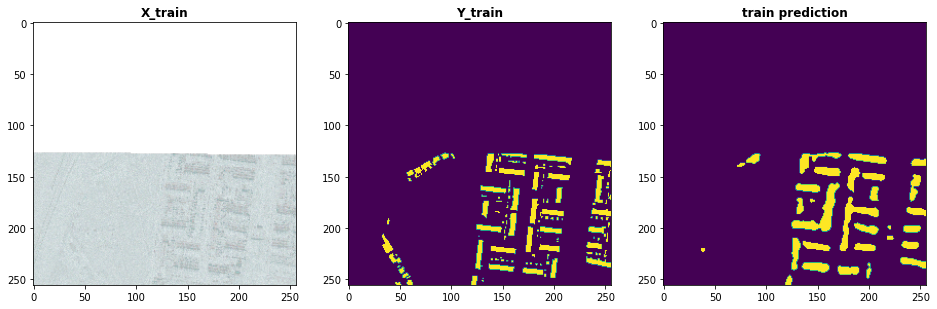

index: 27
val preds  set


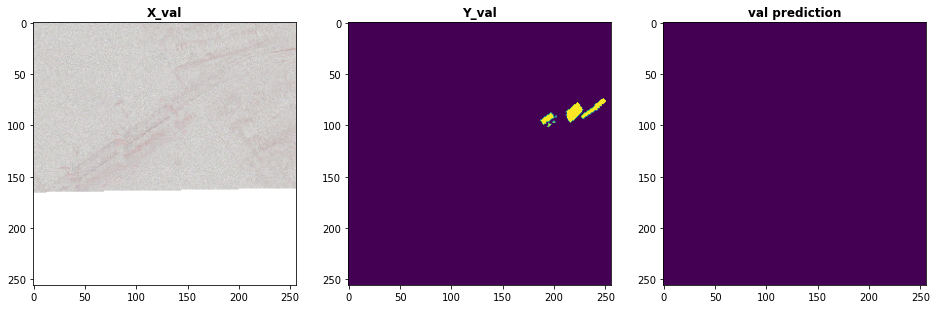

index: 19
test preds  set


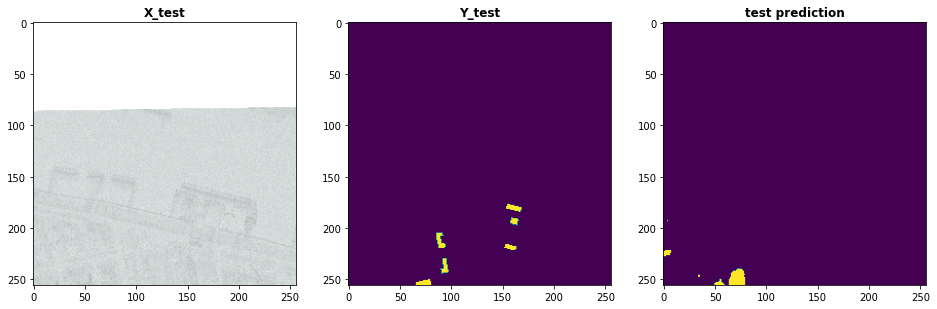

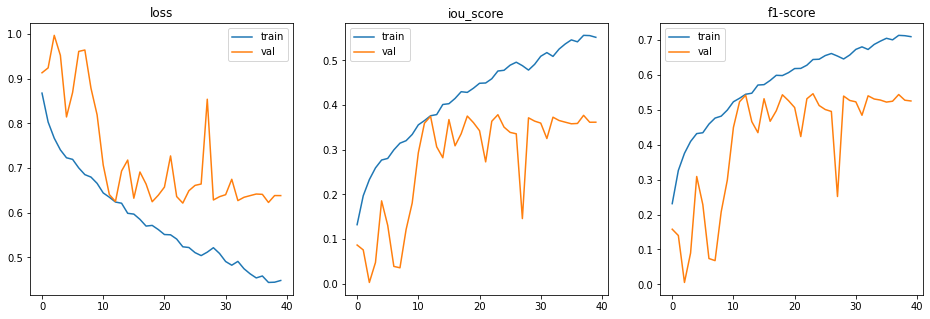

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

##### epoch: 80

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 80

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb0'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb0', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 2s 20ms/step
train set evaluation
720/720 [==============================] - 16s 22ms/step
loss :  0.3077313462893168
iou_score :  0.6921440362930298
f1-score :  0.8176007270812988

validation set evaluation
80/80 [==============================] - 2s 21ms/step
loss :  0.8954401016235352
iou_score :  0.11158552020788193
f1-score :  0.19963227212429047

test set evaluation
80/80 [==============================] - 2s 20ms/step
loss :  0.641518235206604
iou_score :  0.36708661913871765
f1-score :  0.5363205075263977
saved model metrics


index: 444
train preds  set


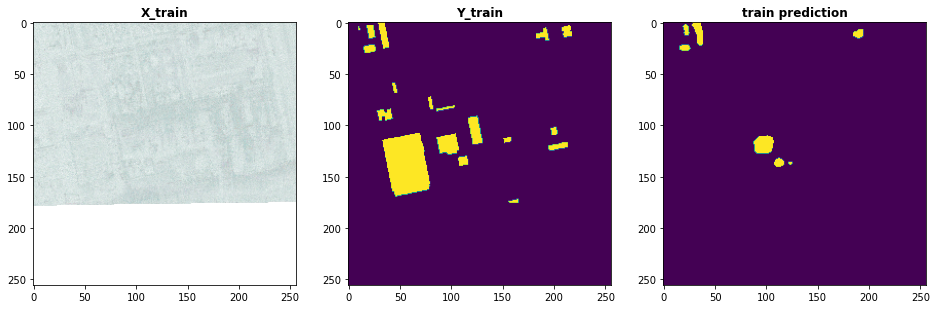

index: 28
val preds  set


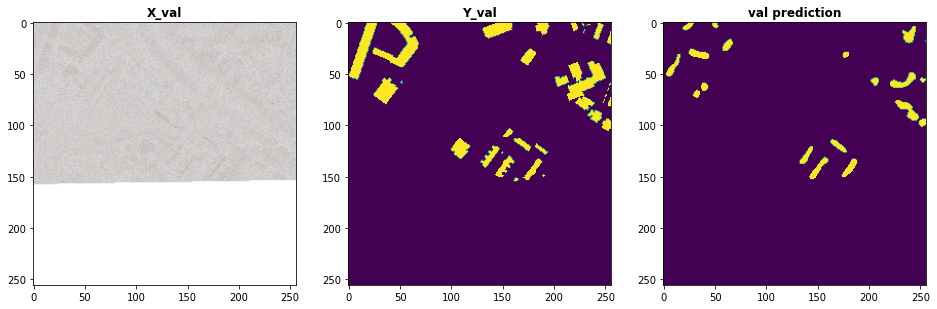

index: 34
test preds  set


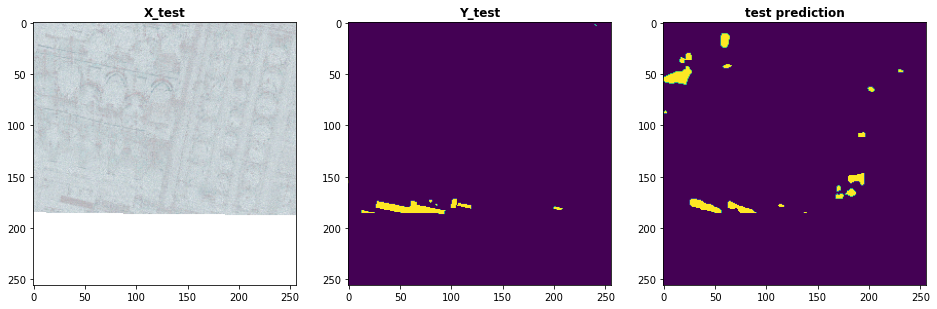

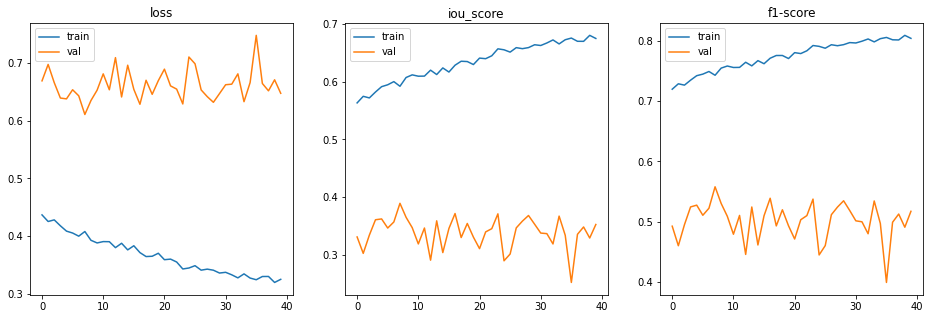

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

#### C --- pretrain: resnet34, loss: BinaryFocalLoss(alpha=0.25, gamma=2.0)   (default)


##### epoch: 20

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss(alpha=0.25, gamma=2.0)
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss(alpha=0.25, gamma=2.0)'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 29s 40ms/step - loss: 0.0232 - iou_score: 0.0740 - f1-score: 0.1375 - val_loss: 0.3796 - val_iou_score: 0.0030 - val_f1-score: 0.0059
Epoch 2/20
720/720 [==============================] - 18s 26ms/step - loss: 0.0178 - iou_score: 0.0888 - f1-score: 0.1627 - val_loss: 0.3666 - val_iou_score: 0.0026 - val_f1-score: 0.0053
Epoch 3/20
720/720 [==============================] - 19s 26ms/step - loss: 0.0175 - iou_score: 0.0928 - f1-score: 0.1692 - val_loss: 0.2749 - val_iou_score: 0.0135 - val_f1-score: 0.0264
Epoch 4/20
720/720 [==============================] - 19s 26ms/step - loss: 0.0172 - iou_score: 0.0962 - f1-score: 0.1751 - val_loss: 0.0582 - val_iou_score: 0.0635 - val_f1-score: 0.1188
Epoch 5/20
720/720 [==============================] - 19s 26ms/step - loss: 0.0173 - iou_score: 0.0959 - f1-score: 0.1746 - val_loss: 0.1508 - val_iou_score: 0.0448 - val_f1-score: 0.0839
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 7ms/step
train set evaluation
720/720 [==============================] - 5s 7ms/step
loss :  0.015514187721742524
iou_score :  0.13390570878982544
f1-score :  0.23581631481647491

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  9.585833740234374
iou_score :  0.17066220939159393
f1-score :  0.2899734377861023

test set evaluation
80/80 [==============================] - 1s 7ms/step
loss :  0.018745551258325575
iou_score :  0.1422591656446457
f1-score :  0.2489534169435501
saved model metrics


index: 667
train preds  set


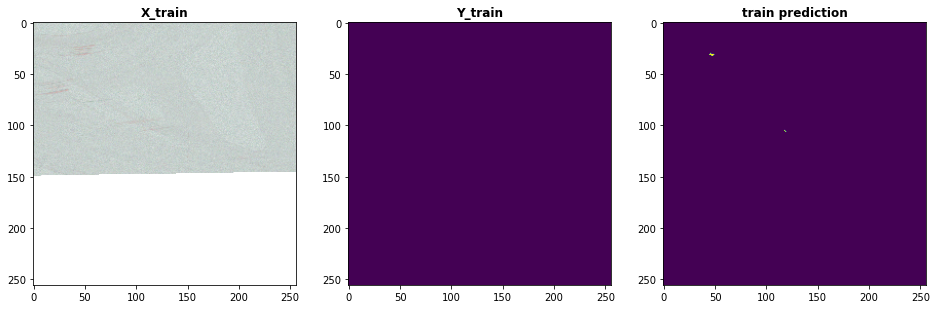

index: 50
val preds  set


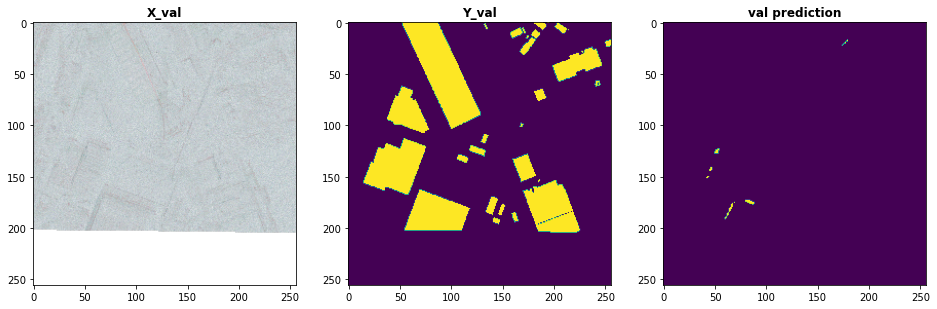

index: 55
test preds  set


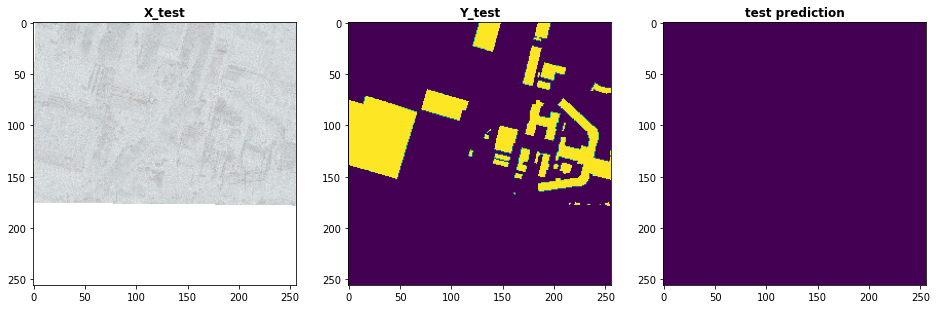

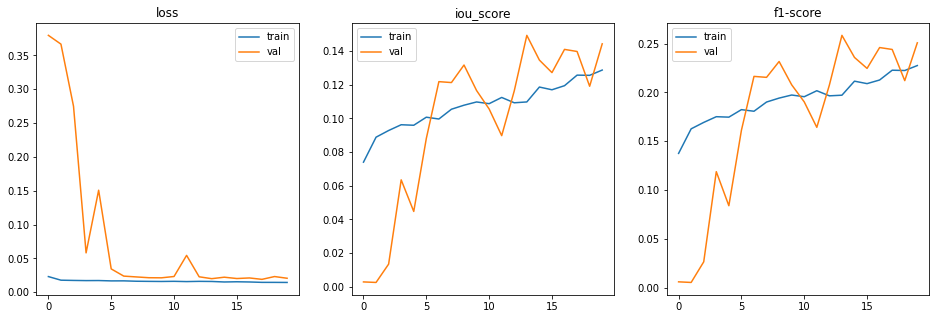

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

##### epoch: 40 (tweak)

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss(alpha=0.5, gamma=1.5)
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 80

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss(alpha=0.25, gamma=2.0)'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

# model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
# model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

Train on 720 samples, validate on 80 samples
Epoch 1/80
720/720 [==============================] - 30s 42ms/step - loss: 0.0423 - iou_score: 0.0828 - f1-score: 0.1523 - val_loss: 0.7660 - val_iou_score: 0.0093 - val_f1-score: 0.0184
Epoch 2/80
720/720 [==============================] - 19s 27ms/step - loss: 0.0343 - iou_score: 0.0969 - f1-score: 0.1758 - val_loss: 0.7150 - val_iou_score: 0.0032 - val_f1-score: 0.0065
Epoch 3/80
720/720 [==============================] - 19s 26ms/step - loss: 0.0329 - iou_score: 0.1040 - f1-score: 0.1877 - val_loss: 0.3736 - val_iou_score: 0.0340 - val_f1-score: 0.0654
Epoch 4/80
720/720 [==============================] - 19s 27ms/step - loss: 0.0325 - iou_score: 0.1068 - f1-score: 0.1925 - val_loss: 0.0579 - val_iou_score: 0.1074 - val_f1-score: 0.1929
Epoch 5/80
720/720 [==============================] - 19s 27ms/step - loss: 0.0316 - iou_score: 0.1119 - f1-score: 0.2004 - val_loss: 0.0495 - val_iou_score: 0.1127 - val_f1-score: 0.2017
Epoch 6/80
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 7ms/step
train set evaluation
720/720 [==============================] - 5s 7ms/step
loss :  0.008074551955279377
iou_score :  0.47984322905540466
f1-score :  0.6477789878845215

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  33.302450561523436
iou_score :  0.17154066264629364
f1-score :  0.2899274230003357

test set evaluation
80/80 [==============================] - 1s 7ms/step
loss :  0.029797783866524697
iou_score :  0.3282945156097412
f1-score :  0.49411049485206604
saved model metrics


index: 692
train preds  set


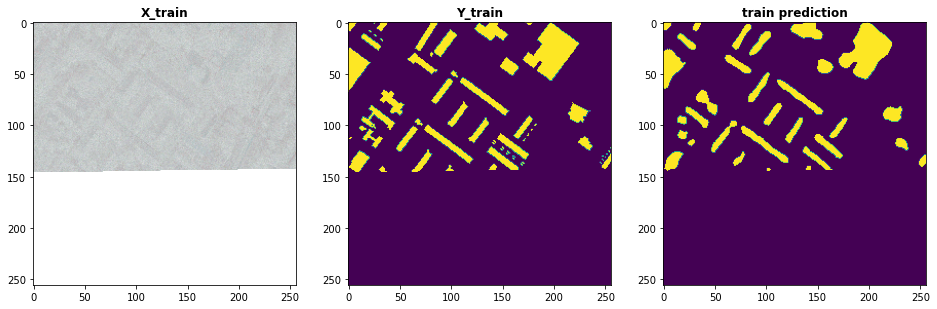

index: 31
val preds  set


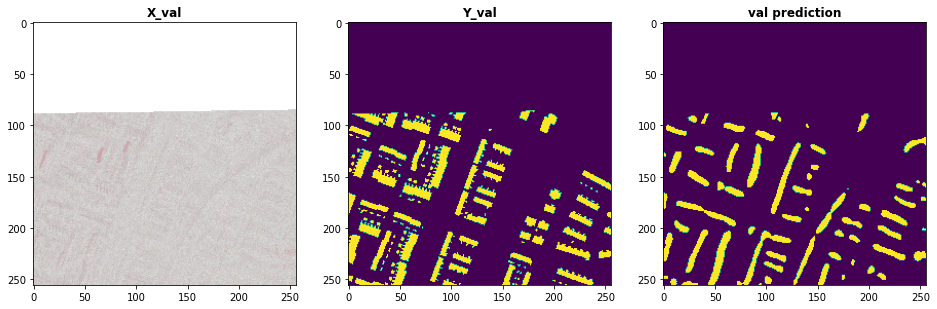

index: 65
test preds  set


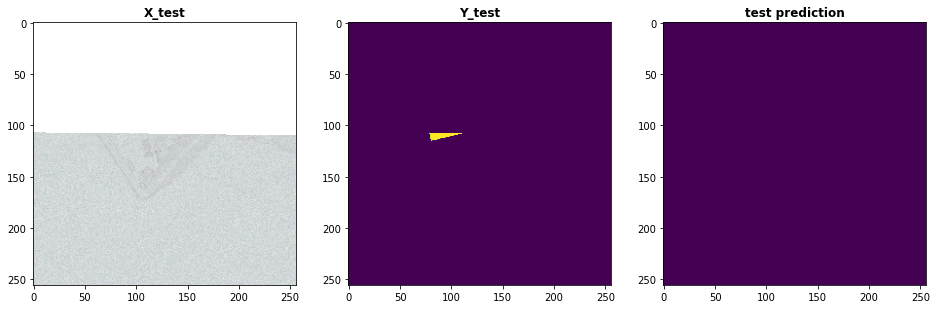

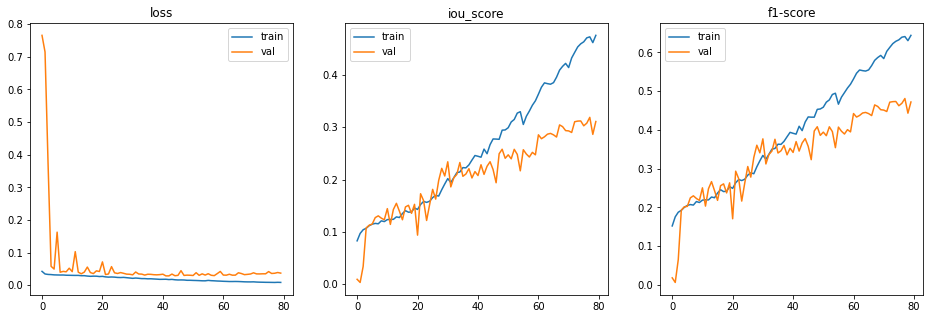

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

##### epoch: 40

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss(alpha=0.25, gamma=2.0)
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 40

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss(alpha=0.25, gamma=2.0)'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

model.load_weights(PATH_SAVED_MODELS/'MODEL_segmentation-models Unet__PRETRAIN_resnet34__LOSS_BinaryFocalLoss(alpha=0.25, gamma=2.0)__EPOCH_20__TRAIN_800__TEST_80_WEIGHTS.h5')
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=20, validation_split=MODEL_VAL_SPLIT)
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 29s 41ms/step - loss: 0.0143 - iou_score: 0.1323 - f1-score: 0.2331 - val_loss: 0.0252 - val_iou_score: 0.1580 - val_f1-score: 0.2718
Epoch 2/20
720/720 [==============================] - 19s 26ms/step - loss: 0.0140 - iou_score: 0.1373 - f1-score: 0.2407 - val_loss: 0.0177 - val_iou_score: 0.1577 - val_f1-score: 0.2711
Epoch 3/20
720/720 [==============================] - 19s 26ms/step - loss: 0.0143 - iou_score: 0.1343 - f1-score: 0.2362 - val_loss: 0.0517 - val_iou_score: 0.1438 - val_f1-score: 0.2503
Epoch 4/20
720/720 [==============================] - 19s 26ms/step - loss: 0.0143 - iou_score: 0.1333 - f1-score: 0.2345 - val_loss: 0.0185 - val_iou_score: 0.1442 - val_f1-score: 0.2508
Epoch 5/20
720/720 [==============================] - 19s 26ms/step - loss: 0.0140 - iou_score: 0.1388 - f1-score: 0.2431 - val_loss: 0.0205 - val_iou_score: 0.1627 - val_f1-score: 0.2788
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 7ms/step
train set evaluation
720/720 [==============================] - 5s 7ms/step
loss :  0.010407721975611316
iou_score :  0.2024240344762802
f1-score :  0.3363272547721863

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  8.506752872467041
iou_score :  0.2207106351852417
f1-score :  0.35917234420776367

test set evaluation
80/80 [==============================] - 1s 7ms/step
loss :  0.01358033362776041
iou_score :  0.1996850222349167
f1-score :  0.3326992690563202
saved model metrics


index: 283
train preds  set


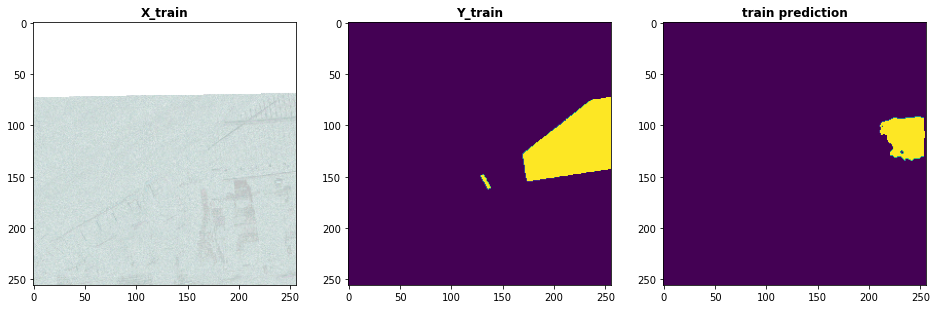

index: 63
val preds  set


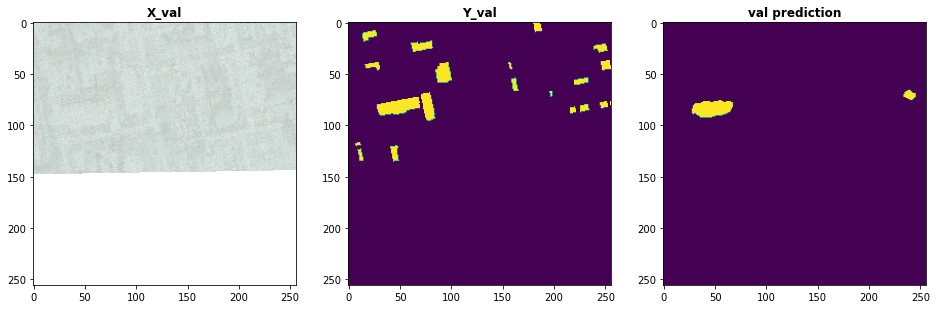

index: 33
test preds  set


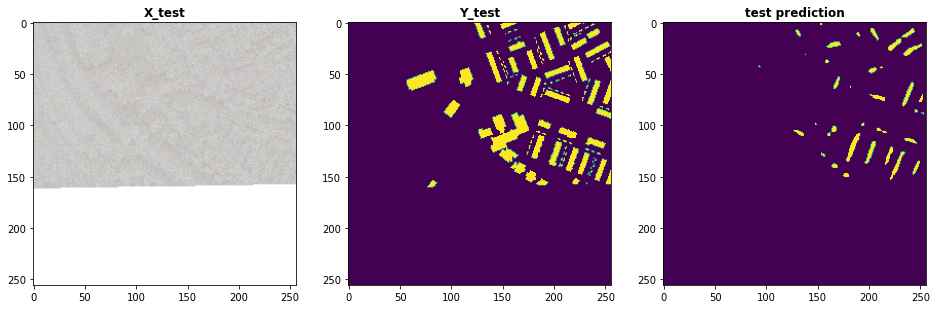

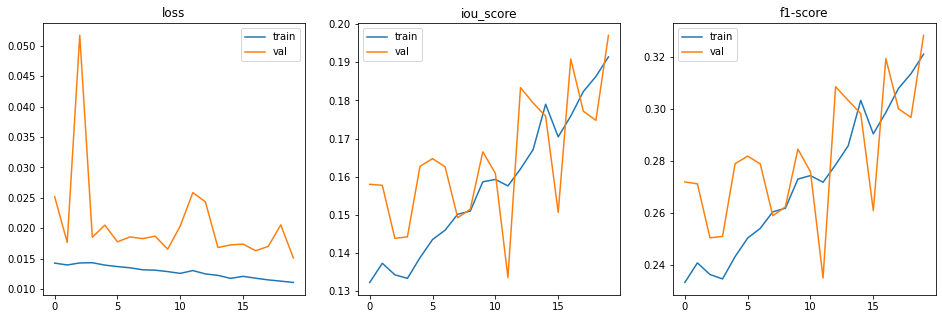

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

#### D --- pretrain: efficientnetb0, loss: BinaryFocalLoss(alpha=0.25, gamma=2.0) (default)


##### epoch: 20

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss(alpha=0.25, gamma=2.0)
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb0'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss(alpha=0.25, gamma=2.0)'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb0', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

# model.load_weights(PATH_SAVED_MODELS/'xxxx')
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=xxxx, validation_split=MODEL_VAL_SPLIT)
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 44s 61ms/step - loss: 0.0306 - iou_score: 0.0680 - f1-score: 0.1270 - val_loss: 0.0509 - val_iou_score: 0.0627 - val_f1-score: 0.1173
Epoch 2/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0186 - iou_score: 0.0823 - f1-score: 0.1518 - val_loss: 0.0311 - val_iou_score: 0.0657 - val_f1-score: 0.1227
Epoch 3/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0181 - iou_score: 0.0871 - f1-score: 0.1598 - val_loss: 0.0278 - val_iou_score: 0.0815 - val_f1-score: 0.1501
Epoch 4/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0175 - iou_score: 0.0889 - f1-score: 0.1625 - val_loss: 0.0266 - val_iou_score: 0.0807 - val_f1-score: 0.1489
Epoch 5/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0170 - iou_score: 0.0957 - f1-score: 0.1744 - val_loss: 0.0325 - val_iou_score: 0.0708 - val_f1-score: 0.1319
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 6s 8ms/step
loss :  0.013181931856605742
iou_score :  0.14341843128204346
f1-score :  0.2505533695220947

validation set evaluation
80/80 [==============================] - 1s 9ms/step
loss :  8.779765701293945
iou_score :  0.1869356781244278
f1-score :  0.3143775165081024

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.017700626514852047
iou_score :  0.14359518885612488
f1-score :  0.2509266436100006
saved model metrics


index: 136
train preds  set


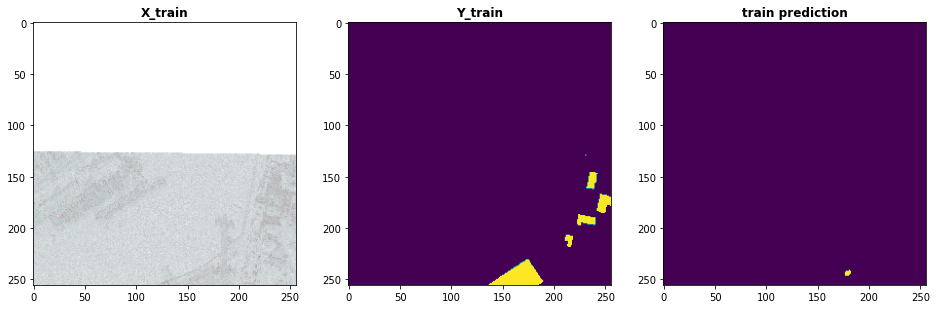

index: 74
val preds  set


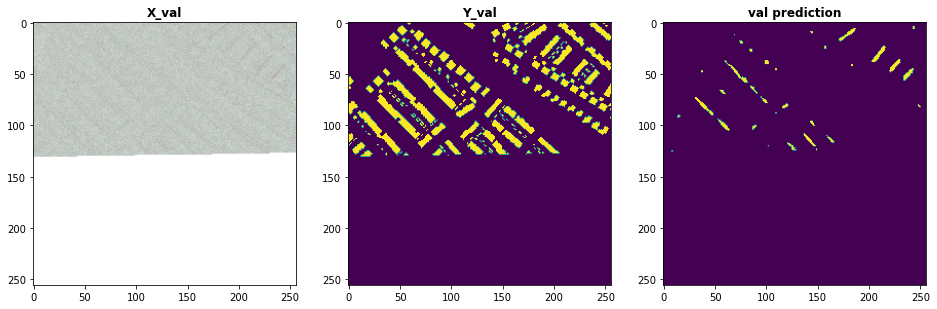

index: 72
test preds  set


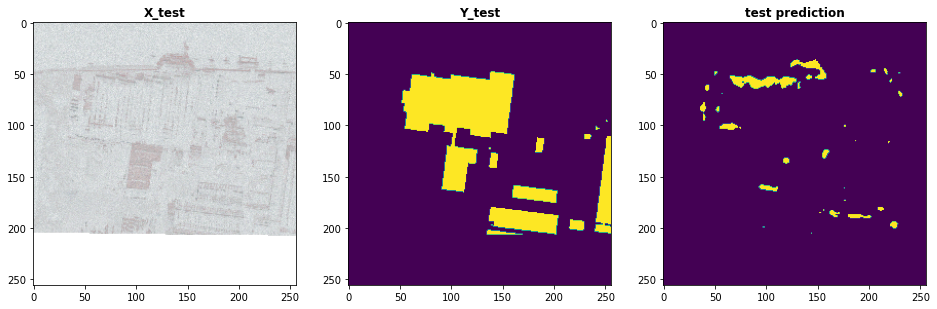

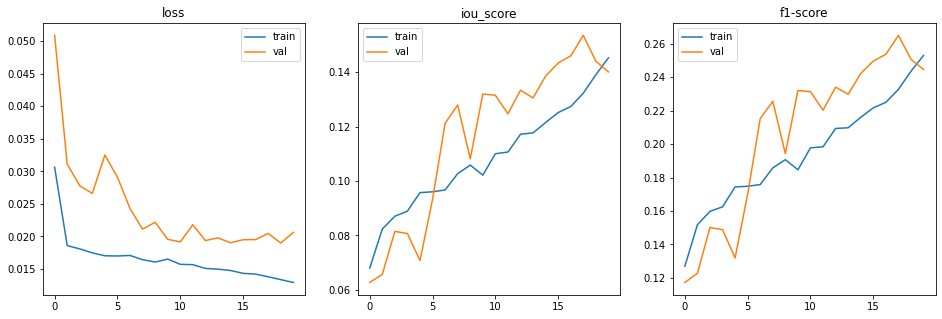

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

##### epoch: 40

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss(alpha=0.25, gamma=2.0)
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 40

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb0'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss(alpha=0.25, gamma=2.0)'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb0', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

model.load_weights(PATH_SAVED_MODELS/'MODEL_segmentation-models Unet__PRETRAIN_efficientnetb0__LOSS_BinaryFocalLoss(alpha=0.25, gamma=2.0)__EPOCH_20__TRAIN_800__TEST_80_WEIGHTS.h5')
results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=20, validation_split=MODEL_VAL_SPLIT)
# results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 44s 61ms/step - loss: 0.0129 - iou_score: 0.1506 - f1-score: 0.2611 - val_loss: 0.0204 - val_iou_score: 0.1512 - val_f1-score: 0.2612
Epoch 2/20
720/720 [==============================] - 25s 35ms/step - loss: 0.0126 - iou_score: 0.1581 - f1-score: 0.2720 - val_loss: 0.0209 - val_iou_score: 0.1451 - val_f1-score: 0.2520
Epoch 3/20
720/720 [==============================] - 25s 35ms/step - loss: 0.0125 - iou_score: 0.1589 - f1-score: 0.2735 - val_loss: 0.0246 - val_iou_score: 0.1324 - val_f1-score: 0.2328
Epoch 4/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0126 - iou_score: 0.1595 - f1-score: 0.2741 - val_loss: 0.0232 - val_iou_score: 0.1337 - val_f1-score: 0.2343
Epoch 5/20
720/720 [==============================] - 26s 35ms/step - loss: 0.0121 - iou_score: 0.1660 - f1-score: 0.2835 - val_loss: 0.0203 - val_iou_score: 0.1554 - val_f1-score: 0.2676
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 6s 8ms/step
loss :  0.009087070036265585
iou_score :  0.2666214108467102
f1-score :  0.42052170634269714

validation set evaluation
80/80 [==============================] - 1s 9ms/step
loss :  9.779751777648926
iou_score :  0.20466184616088867
f1-score :  0.3381113111972809

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.019558287039399148
iou_score :  0.187056764960289
f1-score :  0.3147529363632202
saved model metrics


index: 73
train preds  set


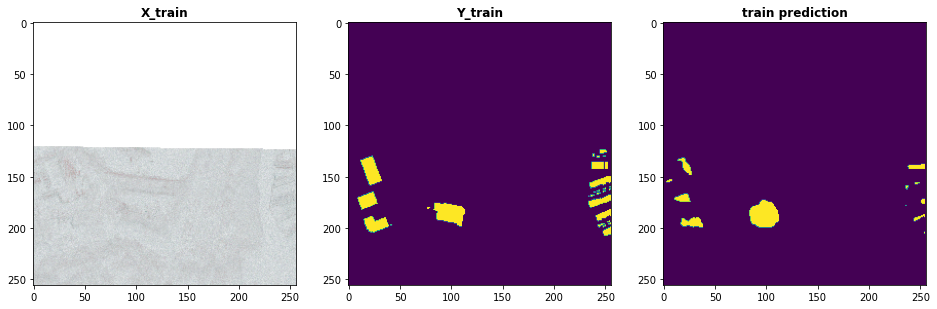

index: 55
val preds  set


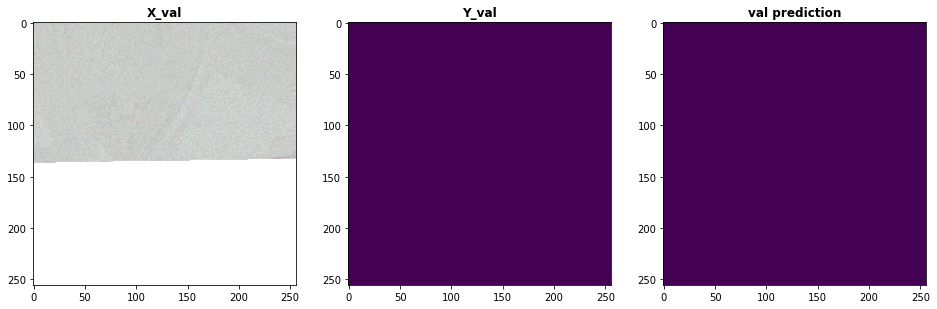

index: 47
test preds  set


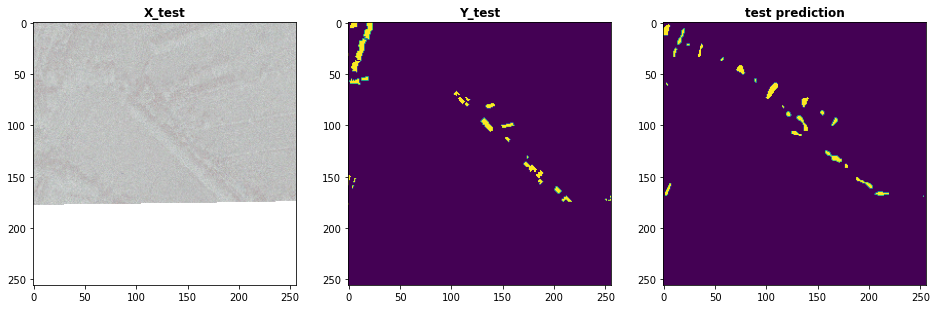

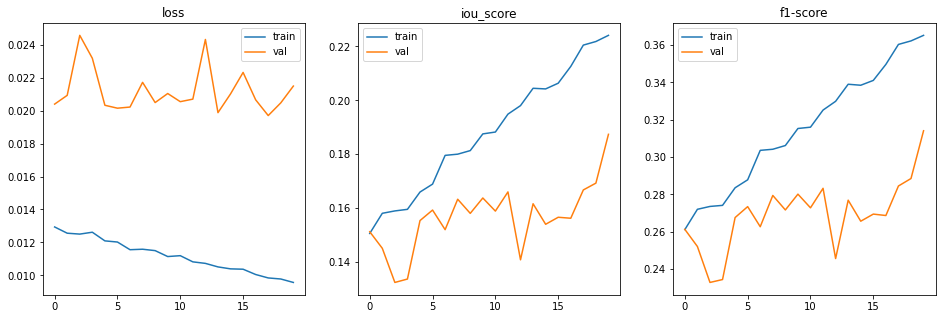

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

## Bring in the SAR data (3200-201)
The geotiff metadata has probably been copied wrongly for now 

In [ ]:
''' run when changing parameters '''
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE

PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK)
X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate = gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX)

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' run when changing parameters '''
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE

PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK)
X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate = gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX)

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: True, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/S

### No rotation

In [ ]:
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

#### A --- pretrain: resnet34, loss: jaccardLoss


##### epoch: 20

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### Rotation

In [ ]:
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate

#### A --- pretrain: resnet34, loss: jaccardLoss


##### epoch: 20

In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_COMMENTS = ''

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

model.save(PATH_SAVED_MODELS/(MODEL_NAME+'.h5'))
model.save_weights(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'))

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

# TRIAL

In [ ]:
root_dir

'/content/gdrive/My Drive/Colab Notebooks'

In [ ]:
DATA = Path(root_dir + '/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity')

In [ ]:
fnames = next(os.walk(DATA))[2]

In [ ]:
fnames[:3]

['SN6_Train_AOI_11_Rotterdam_SAR-Intensity_20190804113009_20190804113242_tile_4800.tif',
 'SN6_Train_AOI_11_Rotterdam_SAR-Intensity_20190822101929_20190822102224_tile_10381.tif',
 'SN6_Train_AOI_11_Rotterdam_SAR-Intensity_20190822160239_20190822160529_tile_3879.tif']

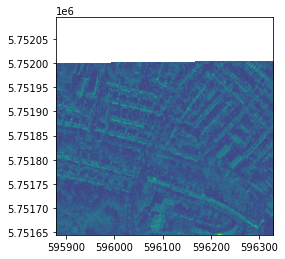

In [ ]:
a = rasterio.open(DATA/fnames[1073])
show(a)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(4, 900, 900) float32 74.76429 0.0


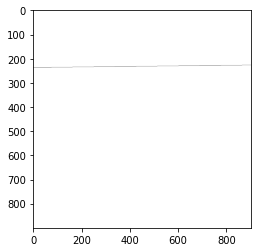

In [ ]:
a = rasterio.open(DATA/fnames[1072]).read()
print(a.shape, a.dtype, np.amax(a), np.amin(a))
show(a)

In [ ]:
min = np.amin(a)
max = np.amax(a)
print(min,max)

0.0 68.428955


In [ ]:
for n, id in tqdm(enumerate(fnames), total=len(fnames), position=0, leave=True):
  img = rasterio.open(DATA/id).read()
  if np.amin(img) < min:
    min = np.amin(img)
  if np.amax(img) > max:
    max = np.amax(img)
print(min, max)

100%|██████████| 3401/3401 [54:05<00:00,  1.05it/s]

0.0 92.87763


max of sar: 92.87763
min of sar: 0.0

In [ ]:
a *= 255.0/max
a

array([[[105.62758 , 110.65355 , 124.80363 , ...,  44.488213,
          53.550514,  51.59809 ],
        [129.78363 , 134.87904 , 138.34793 , ...,  59.49119 ,
          61.830505,  57.689655],
        [123.25877 , 120.15208 , 120.3231  , ...,  73.12149 ,
          73.242226,  56.181316],
        ...,
        [  0.      ,   0.      ,   0.      , ...,   0.      ,
           0.      ,   0.      ],
        [  0.      ,   0.      ,   0.      , ...,   0.      ,
           0.      ,   0.      ],
        [  0.      ,   0.      ,   0.      , ...,   0.      ,
           0.      ,   0.      ]],

       [[101.24912 , 104.81622 , 100.56325 , ...,  71.45638 ,
          69.73795 ,  71.27154 ],
        [115.086845, 113.96414 , 113.88826 , ...,  77.321846,
          76.85537 ,  81.80052 ],
        [110.06491 ,  95.856316,  98.4447  , ...,  71.99857 ,
          77.22055 ,  77.03885 ],
        ...,
        [  0.      ,   0.      ,   0.      , ...,   0.      ,
           0.      ,   0.      ],
        [  0

In [ ]:
print(np.amin(a), np.amax(a))

0.0 187.87498
